# Recognition Training with kraken

In [1]:
import kraken
from kraken.lib import arrow_dataset
from kraken.lib.train import RecognitionModel, KrakenTrainer
import glob

## Paths

In [2]:
train_data_expanded = 'in_repolygonized/in_expanded/'
train_data_abbreviated = 'in_repolygonized/in_abbreviated/'
gt_expanded = glob.glob(train_data_expanded + '*/*.xml')
gt_abbreviated = glob.glob(train_data_abbreviated + '/*/*.xml')

## Binary Datasets

In [17]:
arrow_dataset.build_binary_dataset(
    files=gt_expanded,
    output_file='datasets/fontes_impr_expanded.arrow',
    format_type='page',
    ignore_splits=True,
    random_split=(0.8,0.1,0.1)
)

Invalid line 6 in in_repolygonized/in_expanded/GŁOG_Intr_1/16526990558888bsb11110894-0020.jpg
Invalid line 21 in in_repolygonized/in_expanded/GŁOG_Intr_1/16526990558888bsb11110894-0020.jpg
Invalid line 4 in in_repolygonized/in_expanded/GŁOG_Intr_1/16526990558888bsb11110894-0012.jpg
Invalid line 6 in in_repolygonized/in_expanded/GŁOG_Intr_1/16526990558888bsb11110894-0012.jpg
Invalid line 9 in in_repolygonized/in_expanded/GŁOG_Intr_1/16526990558888bsb11110894-0012.jpg
Invalid line 0 in in_repolygonized/in_expanded/SACR_Modus/BOss_XVI_Qu.2403-0069.jpg
Invalid line 5 in in_repolygonized/in_expanded/SACR_Modus/BOss_XVI_Qu.2403-0047.jpg
Invalid line 24 in in_repolygonized/in_expanded/SACR_Modus/BOss_XVI_Qu.2403-0047.jpg
Invalid line 21 in in_repolygonized/in_expanded/SACR_Modus/BOss_XVI_Qu.2403-0031.jpg
Invalid line 6 in in_repolygonized/in_expanded/SACR_Modus/BOss_XVI_Qu.2403-0074.jpg
Invalid line 12 in in_repolygonized/in_expanded/SACR_Modus/BOss_XVI_Qu.2403-0074.jpg
Invalid line 13 in in_

In [18]:
arrow_dataset.build_binary_dataset(
    files=gt_abbreviated,
    output_file='datasets/fontes_impr_abbreviated.arrow',
    format_type='page',
    ignore_splits=True,
    random_split=(0.8,0.1,0.1)
)

Invalid line 20 in in_repolygonized/in_abbreviated/GIELCZ_Exp_WD/GIELCZ-0147.jpg
Invalid line 30 in in_repolygonized/in_abbreviated/GIELCZ_Exp_WD/GIELCZ-0147.jpg
Invalid line 18 in in_repolygonized/in_abbreviated/GIELCZ_Exp_WD/GIELCZ-0103.jpg
Invalid line 16 in in_repolygonized/in_abbreviated/GIELCZ_Exp_WD/GIELCZ-0118.jpg
Invalid line 8 in in_repolygonized/in_abbreviated/GIELCZ_Exp_WD/GIELCZ-0101.jpg
Invalid line 1 in in_repolygonized/in_abbreviated/GIELCZ_Exp_WD/GIELCZ-0171.jpg
Invalid line 3 in in_repolygonized/in_abbreviated/GIELCZ_Exp_WD/GIELCZ-0171.jpg
Invalid line 4 in in_repolygonized/in_abbreviated/GIELCZ_Exp_WD/GIELCZ-0171.jpg
Invalid line 8 in in_repolygonized/in_abbreviated/GIELCZ_Exp_WD/GIELCZ-0155.jpg
Invalid line 24 in in_repolygonized/in_abbreviated/GIELCZ_Exp_WD/GIELCZ-0157.jpg
Invalid line 33 in in_repolygonized/in_abbreviated/GIELCZ_Exp_WD/GIELCZ-0121.jpg

KeyboardInterrupt



Dataset Metadata:
- type: kraken_recognition_baseline
- text_type: raw
- image_type: raw
- splits: ['train', 'eval', 'test']
- im_mode: RGB
- legacy_polygons: False
- counts: {'all': 9493, 'train': 7509, 'validation': 952, 'test': 1032}
- Alphabet size: 96 unique characters

Total samples: 9493

--- TRAIN SPLIT SAMPLES ---
Sample 1 (Index 7598):
Text: "IHILOMINVS cum conueuiat, ęquumque est vnum"


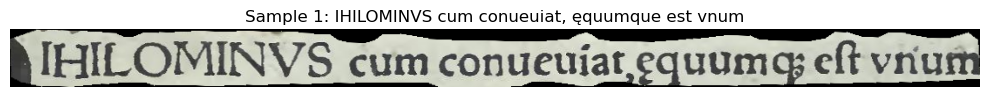

Sample 2 (Index 7120):
Text: "cultationis scilicet ille que sunt propinque polo antartico. Si"


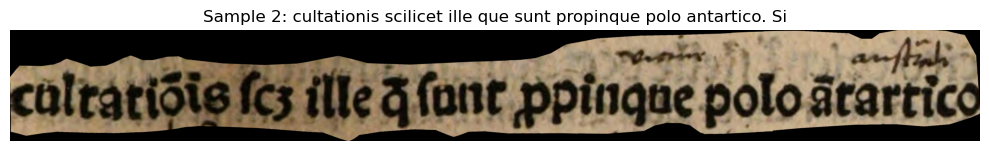

Sample 3 (Index 3086):
Text: "esse in va-"


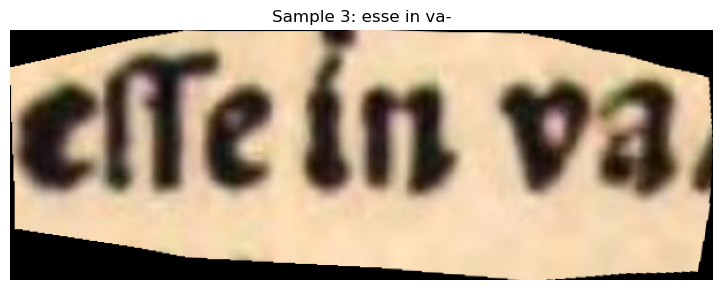


--- VALIDATION SPLIT SAMPLES ---
Sample 1 (Index 3841):
Text: "due conditiones requiruntur ad hoc vt aliquid sit proprie in tempore. Prima / que contineatur a tempore sicut"


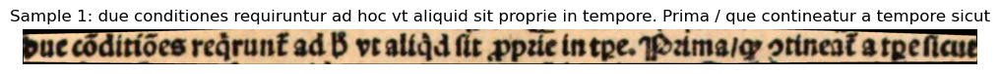

Sample 2 (Index 2613):
Text: "stinet. et patitur pacifice ipsum possessorem. possidere eandem"


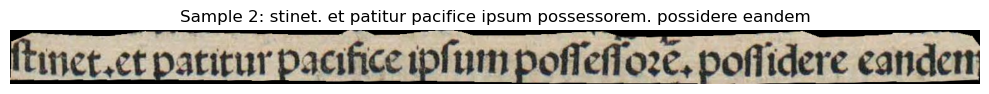

Sample 3 (Index 586):
Text: "dicta distantia iterum est. 47. graduum secundum illas partes seu gra"


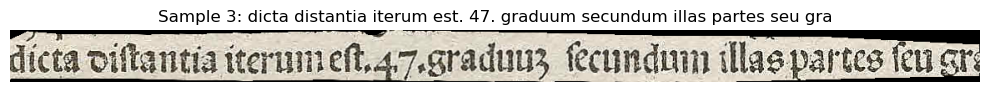


--- TEST SPLIT SAMPLES ---
Sample 1 (Index 6854):
Text: "est secundum bernhardi sentenciam quam a multis hodie hec insignia pas"


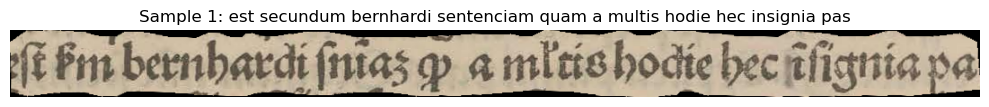

Sample 2 (Index 903):
Text: "d.10.c.7. videlicet accipiendo mediante instrumento armillarum verum locum plane"


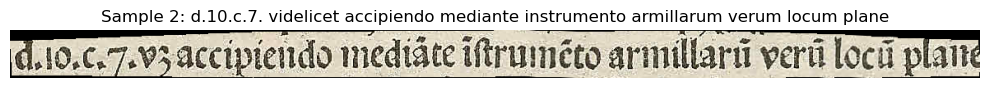

Sample 3 (Index 7514):
Text: "AB ESTIMATIONE."


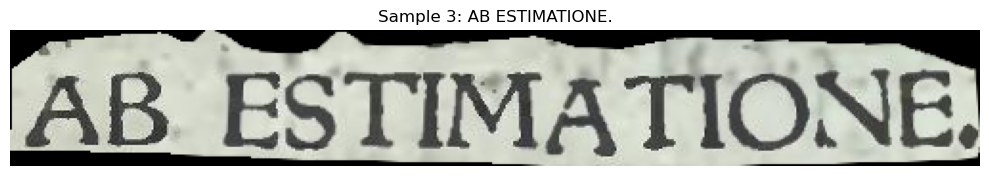

In [4]:
from dataset import explore_arrow_dataset
explore_arrow_dataset('datasets/fontes_impr_expanded.arrow', num_samples=3, mode='all')
#explore_arrow_dataset('datasets/fontes_impr_abbreviated.arrow', num_samples=1, mode='all')

### Setting hyperparameters

In [20]:
hyperparams = kraken.lib.default_specs.RECOGNITION_HYPER_PARAMS
hyperparams.update({"augment" : True})

### Initializing models

In [21]:
model_impr_mccatmus_expanded_new = RecognitionModel(
    model='models/McCATMuS_nfd_nofix_V1.mlmodel',
    resize='new', # strategies for unknown chars: 'fail', 'both', 'new', 'add', 'union'
    hyper_params=hyperparams,
    training_data=['datasets/fontes_impr_expanded.arrow'],
    binary_dataset_split=True,
    format_type='binary', num_workers=15,output="datasets/fontes_impr_expanded.model")

/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.24). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
alphabet mismatch: chars in training set only: {'ε', "'", 'ꝑ', 'ꝗ', '?', '&', 'ꝛ', '~', 'ʒ', 'μ', 'ν', 'ꝓ', 'Y', '☞', 'η', 'π', 'ο', 'J', '\\', 'Z', '⁊', 'τ', 'ł', 'ι'} (not included in accuracy test during training)


In [23]:
model_impr_mccatmus_abbreviated_new = RecognitionModel(
    model='models/McCATMuS_nfd_nofix_V1.mlmodel',
    resize='new', # strategies for unknown chars: 'fail', 'both', 'new', 'add', 'union'
    hyper_params=hyperparams,
    training_data=['datasets/fontes_impr_abbreviated.arrow'],
    binary_dataset_split=True,
    format_type='binary', num_workers=15,output="datasets/fontes_impr_abbreviated.model")

FileNotFoundError: [Errno 2] Failed to open local file 'datasets/fontes_impr_abbreviated.arrow'. Detail: [errno 2] No such file or directory

### Fitting

In [22]:
trainer_impr_mccatmus_expanded_new = KrakenTrainer()
trainer_impr_mccatmus_expanded_new.fit(model_impr_mccatmus_expanded_new)
model_impr_mccatmus_expanded_new.nn.save_model('models/fontes_impr_expanded.mlmodel')

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃    ┃ Name      ┃ Type                     ┃ Params ┃ Mode  ┃                 In sizes ┃               Out sizes ┃
┡━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ 0  │ val_cer   │ CharErrorRate            │      0 │ train │                        ? │                       ? │
│ 1  │ val_wer   │ WordErrorRate            │      0 │ train │                        ? │                       ? │
│ 2  │ net       │ MultiParamSequential     │  4.0 M │ train │  [[1, 1, 120, 400], '?'] │   [[1, 97, 1, 50], '?'] │
│ 3  │ net.C_0   │ ActConv2D                │  1.3 K │ train │  [[1, 1, 120, 400], '?', │     [[1, 32, 120, 400], │
│    │           │                          │        │       │                     '?'] │                    '?'] │
│ 4  │ net.Do_1  │ Dropout                  │      0 │ train │ [[1, 32, 120, 400], '?', │     [[1, 32, 120, 400], │
│    │           │                          │        │       │                     '?'] │                    '?'] │
│ 5  │ net.Mp_2  │ MaxPool                  │      0 │ train │ [[1, 32, 120, 400], '?', │ [[1, 32, 60, 200], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 6  │ net.C_3   │ ActConv2D                │ 40.0 K │ train │  [[1, 32, 60, 200], '?', │ [[1, 32, 60, 200], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 7  │ net.Do_4  │ Dropout                  │      0 │ train │  [[1, 32, 60, 200], '?', │ [[1, 32, 60, 200], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 8  │ net.Mp_5  │ MaxPool                  │      0 │ train │  [[1, 32, 60, 200], '?', │ [[1, 32, 30, 100], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 9  │ net.C_6   │ ActConv2D                │ 55.4 K │ train │  [[1, 32, 30, 100], '?', │ [[1, 64, 30, 100], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 10 │ net.Do_7  │ Dropout                  │      0 │ train │  [[1, 64, 30, 100], '?', │ [[1, 64, 30, 100], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 11 │ net.Mp_8  │ MaxPool                  │      0 │ train │  [[1, 64, 30, 100], '?', │  [[1, 64, 15, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 12 │ net.C_9   │ ActConv2D                │  110 K │ train │   [[1, 64, 15, 50], '?', │  [[1, 64, 15, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 13 │ net.Do_10 │ Dropout                  │      0 │ train │   [[1, 64, 15, 50], '?', │  [[1, 64, 15, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 14 │ net.S_11  │ Reshape                  │      0 │ train │   [[1, 64, 15, 50], '?', │  [[1, 960, 1, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 15 │ net.L_12  │ TransposedSummarizingRNN │  1.9 M │ train │   [[1, 960, 1, 50], '?', │  [[1, 400, 1, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 16 │ net.Do_13 │ Dropout                  │      0 │ train │   [[1, 400, 1, 50], '?', │  [[1, 400, 1, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 17 │ net.L_14  │ TransposedSummarizingRNN │  963 K │ t

Trainable params: 4.0 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 4.0 M                                                                                                
Total estimated model params size (MB): 16                                                                         
Modules in train mode: 40                                                                                          
Modules in eval mode: 0

Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by 
doing `Trainer(logger=ALogger(...))`

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('val_accuracy', ..., logger=True)` but have no logger configured. You can enable one by 
doing `Trainer(logger=ALogger(...))`

/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('val_word_accuracy', ..., logger=True)` but have no logger configured. You can enable one 
by doing `Trainer(logger=ALogger(...))`

/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('val_metric', ..., logger=True)` but have no logger configured. You can enable one by 
doing `Trainer(logger=ALogger(...))`

Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


In [ ]:
trainer_impr_mccatmus_abbreviated_new = KrakenTrainer()
trainer_impr_mccatmus_abbreviated_new.fit(model_impr_mccatmus_abbreviated_new)
model_impr_mccatmus_abbreviated_new.nn.save_model('models/fontes_impr_abbreviated.mlmodel')

In [34]:
model_impr_mccatmus_expanded_new.best_model

'datasets/fontes_impr_expanded.model_1.mlmodel'

## Evaluation

### Inspecting model and the validation data

In [128]:
# kraken methods
# https://github.com/mittagessen/kraken/blob/ba1ce5657d8b0451f182f4e83ab78814b8e0de13/kraken/ketos/segmentation.py#L424

In [ ]:
from model_analyzer import HTRModelAnalyzer, ModelComparator

In [ ]:
analyzer = HTRModelAnalyzer('datasets/fontes_impr_expanded.model_1.mlmodel')
summary = analyzer.summary()
print(summary)
fig = analyzer.plot_training_metrics()

In [ ]:
# Plot training metrics
try:
    fig = analyzer.plot_training_metrics()
    display(fig)
except ValueError as e:
    print(f"Could not plot training metrics: {e}")

In [10]:
# Evaluate on validation split from your Arrow dataset
validation_results = analyzer.evaluate_on_arrow_dataset(
    arrow_path='datasets/fontes_impr_expanded.arrow', 
    batch_size=16,
    split='test',
    num_workers=16
)

Loading dataset from datasets/fontes_impr_expanded.arrow (split: test)
Loaded 1032 samples
Evaluating model on 1032 samples...


Evaluating fontes_impr_expanded.model_1.mlmodel:   0%|          | 0/65 [00:00<?, ?it/s]

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x714401c07b20>>
Traceback (most recent call last):
  File "/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 

KeyboardInterrupt



In [ ]:
# Show metrics
print(f"Character Error Rate: {validation_results['char_error_rate']:.4f}")
print(f"Accuracy: {validation_results['accuracy']:.4f}")
print(f"Total characters: {validation_results['total_chars']}")

# Plot error distribution 
error_fig = analyzer.plot_error_distribution(validation_results)
error_fig.show()

# Plot confusion matrix
confusion_fig = analyzer.plot_confusion_matrix(validation_results['confusion_matrix'])
confusion_fig.show()

# Plot relation between text length and error rate
length_fig = analyzer.plot_lengths_vs_errors(validation_results['results'])
length_fig.show()

,model,model_path,spec,model_type,alphabet_size,completed_epochs,best_val_accuracy,final_val_accuracy,input_shape
0,FT MCCatmus (all) - new,datasets/fontes_impr_expanded.model_1.mlmodel,"[1,120,0,1 Cr{C_0}3,13,32 Do{Do_1}0.1,2 Mp{Mp_...",recognition,96,2,0.928027,0.923724,1x1x120x0
1,MCatmus,/home/krzys/.config/kraken/McCATMuS_nfd_nofix_...,"[1,120,0,1 Cr{C_0}3,13,32 Do{Do_1}0.1,2 Mp{Mp_...",recognition,116,158,0.928027,0.928027,1x1x120x0


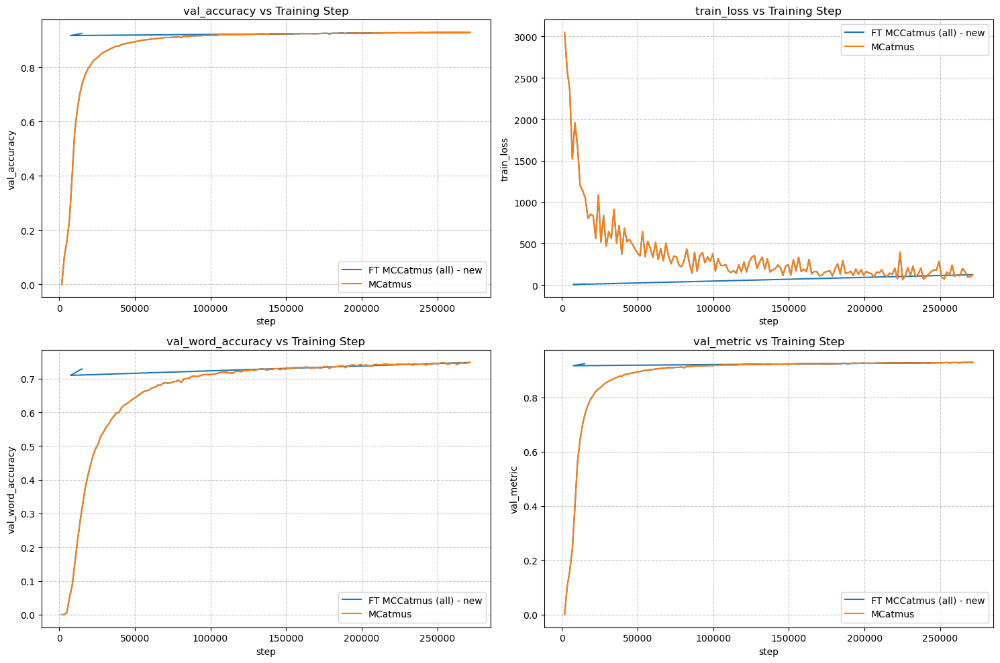

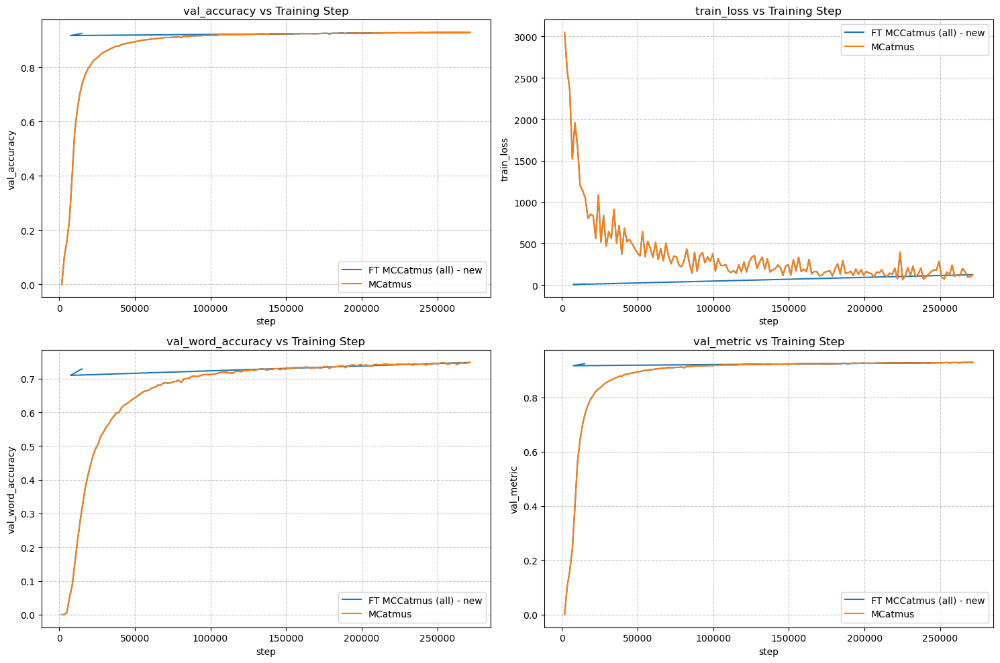

In [13]:
# To compare multiple models
model_paths = [
    #'models/GIELCZ_Exp_raw.mlmodel',
    #'models/GIELCZ_Exp_repol.mlmodel',
    #'models/',
    #'GIELCZ_Exp_repol_mccatmus_union_20.mlmodel',
    #'models/GIELCZ_Exp_repol_mccatmus_new.mlmodel',
    #'models/GIELCZ_Exp_repol_mccatmus_add.mlmodel',
    #!!!'models/fontes_impr_expanded.mlmodel',
    'datasets/fontes_impr_expanded.model_1.mlmodel',
    '/home/krzys/.config/kraken/McCATMuS_nfd_nofix_V1.mlmodel'
]

model_names = [
    #'Raw', 
    #'Repolygonized', 
#     'FT MCCatmus (GIELCZ) - new',
    'FT MCCatmus (all) - new',
    'MCatmus'
              # 'FT MCCatmus - add', 'FT MCCatmus - new', 'MCCatmus'
              ]

# Create comparator
comparator = ModelComparator(model_paths, model_names)

# Compare summaries
comparison_df = comparator.compare_summary()
display(comparison_df)  # Nice tabular display in Jupyter

# Compare training metrics
try:
    metrics_fig = comparator.compare_training_metrics()
    display(metrics_fig)
except ValueError as e:
    print(f"Could not compare training metrics: {e}")

,model,model_path,spec,model_type,alphabet_size,completed_epochs,best_val_accuracy,final_val_accuracy,input_shape
0,FT MCCatmus (all) - new,datasets/fontes_impr_expanded.model_1.mlmodel,"[1,120,0,1 Cr{C_0}3,13,32 Do{Do_1}0.1,2 Mp{Mp_...",recognition,96,2,0.928027,0.923724,1x1x120x0
1,MCatmus,/home/krzys/.config/kraken/McCATMuS_nfd_nofix_...,"[1,120,0,1 Cr{C_0}3,13,32 Do{Do_1}0.1,2 Mp{Mp_...",recognition,116,158,0.928027,0.928027,1x1x120x0


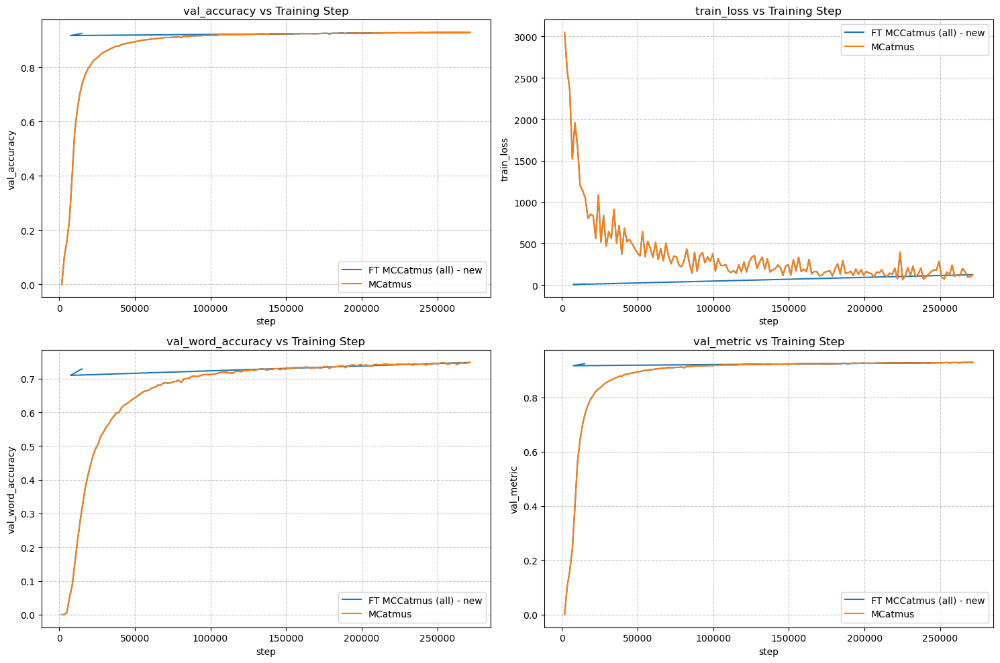

Comparing 2 models on datasets/fontes_impr_expanded.arrow (test split)
--------------------------------------------------

Evaluating model: FT MCCatmus (all) - new
Loading dataset from datasets/fontes_impr_expanded.arrow (split: test)
Loaded 1032 samples
Evaluating model on 1032 samples...


Evaluating fontes_impr_expanded.model_1.mlmodel:   0%|          | 0/129 [00:00<?, ?it/s]

Evaluation complete: CER=0.0730, Accuracy=0.9270 (66815 characters)
  - Accuracy: 0.9270
  - CER: 0.0730
  - Word Accuracy: 0.7480

Evaluating model: MCatmus
Loading dataset from datasets/fontes_impr_expanded.arrow (split: test)
Loaded 1032 samples
Evaluating model on 1032 samples...


Evaluating McCATMuS_nfd_nofix_V1.mlmodel:   0%|          | 0/129 [00:00<?, ?it/s]

Evaluation complete: CER=0.2703, Accuracy=0.7297 (66815 characters)
  - Accuracy: 0.7297
  - CER: 0.2703
  - Word Accuracy: 0.2506

Summary:
--------------------------------------------------
FT MCCatmus (all) - new: Accuracy=0.9270, CER=0.0730
MCatmus: Accuracy=0.7297, CER=0.2703

Generating visualization...
Comparison complete!


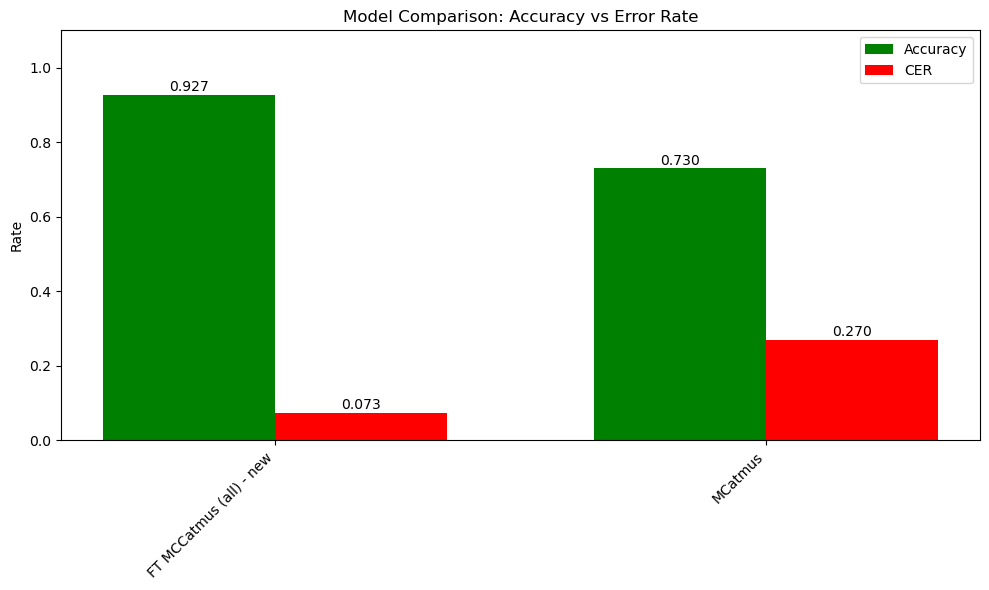

,model,char_error_rate,accuracy,word_accuracy,total_chars
0,FT MCCatmus (all) - new,tensor(0.0730),tensor(0.9270),tensor(0.7480),66815
1,MCatmus,tensor(0.2703),tensor(0.7297),tensor(0.2506),66815


Analyzing error distributions across 2 models...
  - FT MCCatmus (all) - new: 4877 total errors, 474 unique error types
  - MCatmus: 18060 total errors, 1105 unique error types

Top 10 most common errors across all models:
  1. i → ∅: 1281 occurrences
  2.   → ∅: 1200 occurrences
  3. e → ∅: 1032 occurrences
  4. u → ∅: 954 occurrences
  5. m → ∅: 949 occurrences
  ... plus 5 more (see visualization)

Generating error distribution visualization...
Error distribution analysis complete!


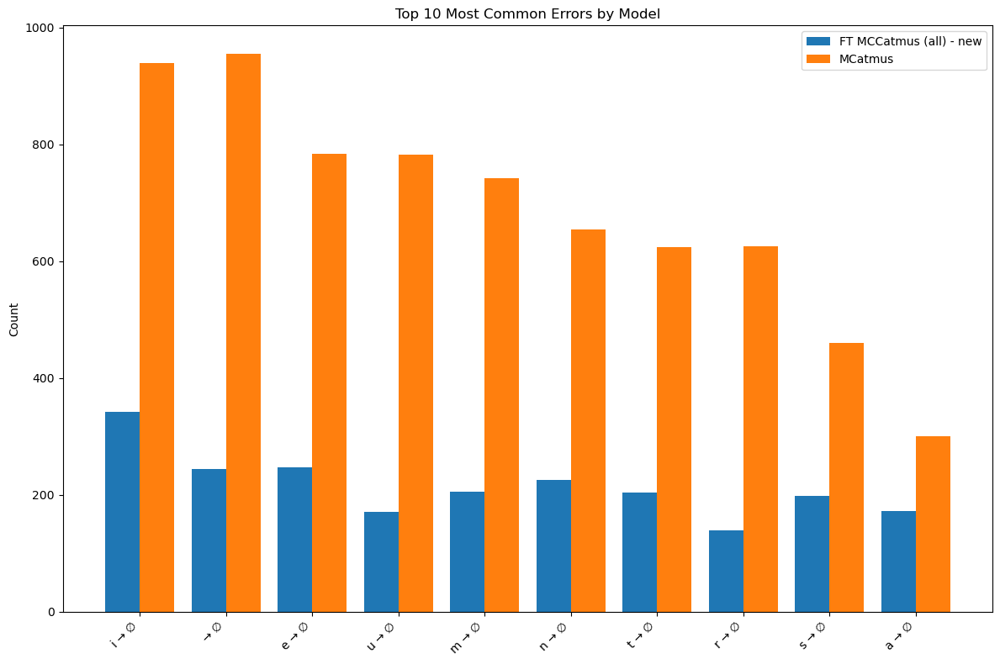



Detailed analysis of first model:

Generating confusion matrix...


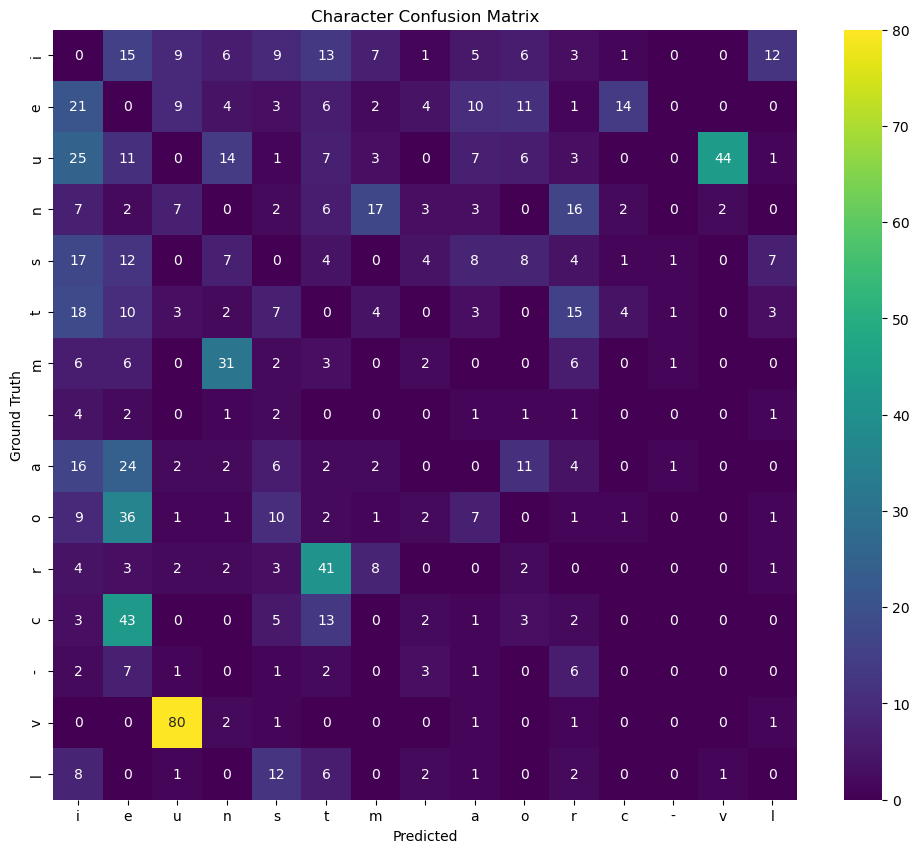


Plotting error distribution...


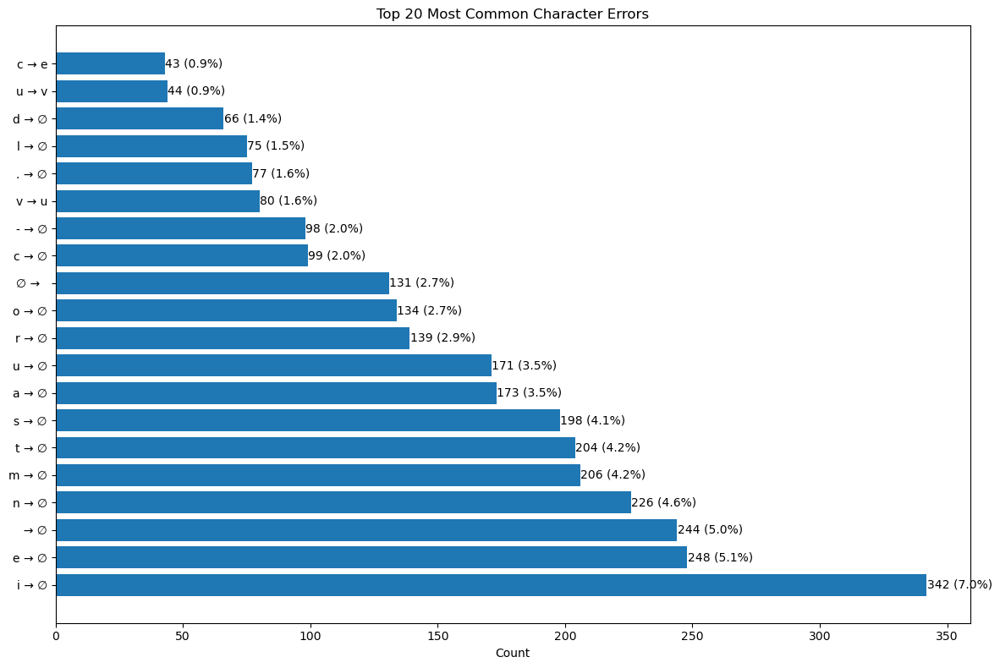


Plotting text length vs. error relationship...


/media/HOME_FOLDERS/krzys/Kod/fontes/htr/output/model_analyzer.py:460: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  length_stats = results_df.groupby('length_bucket').agg(


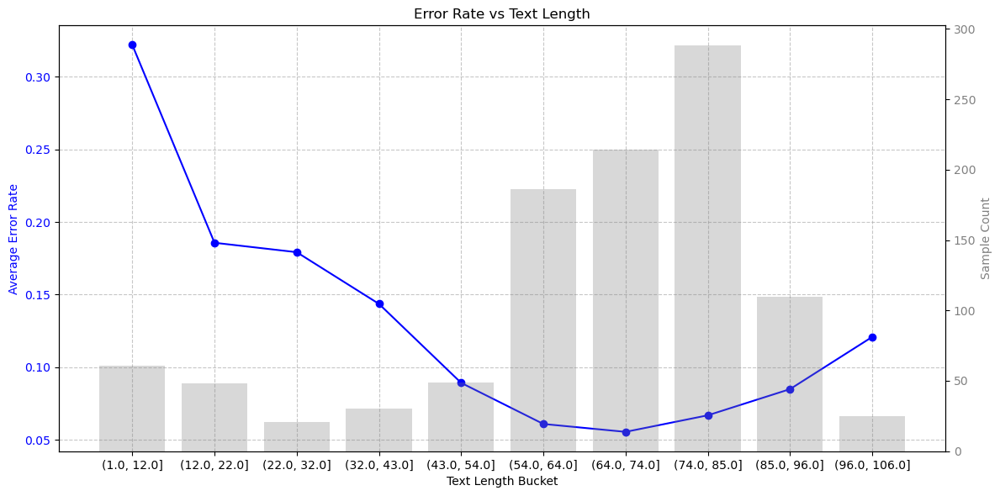

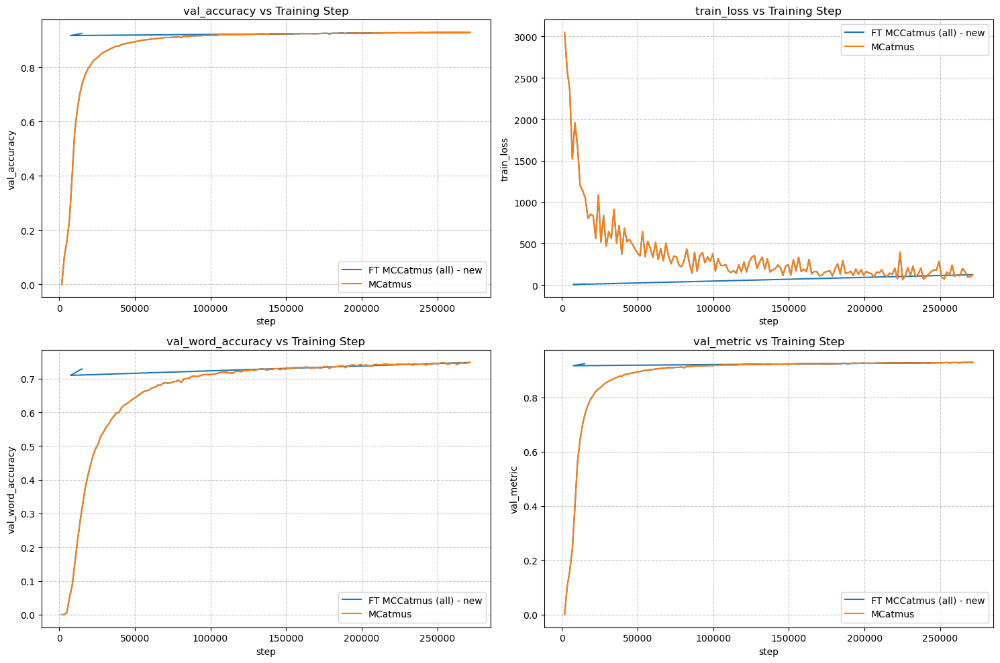

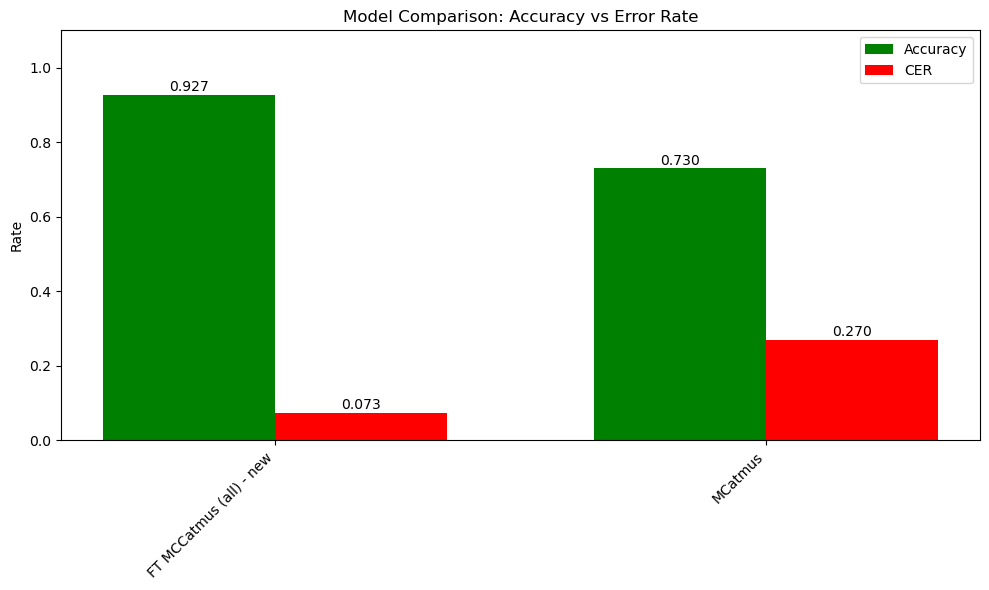

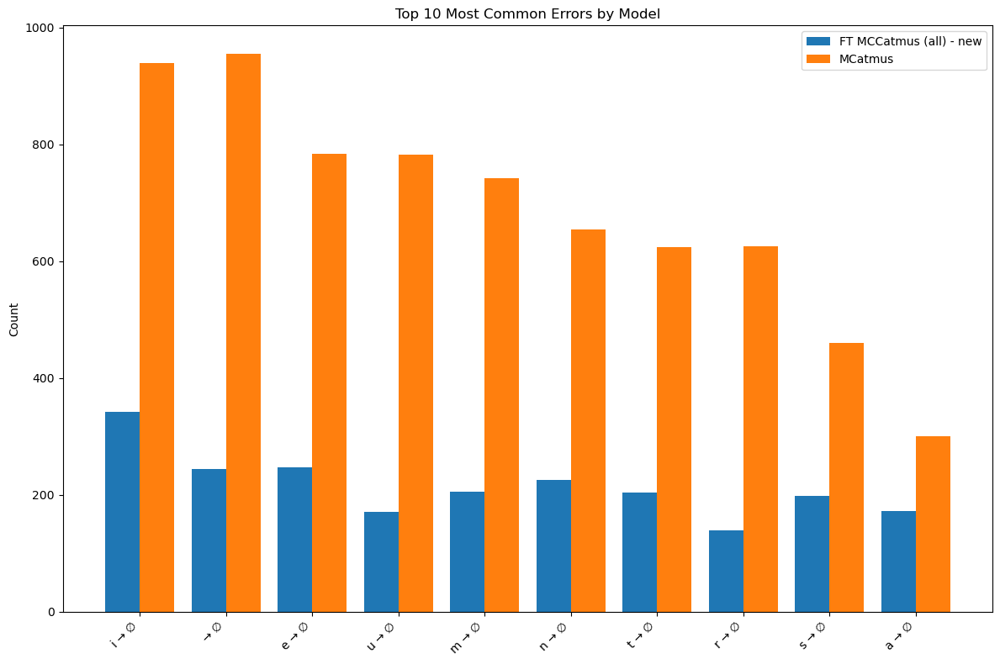

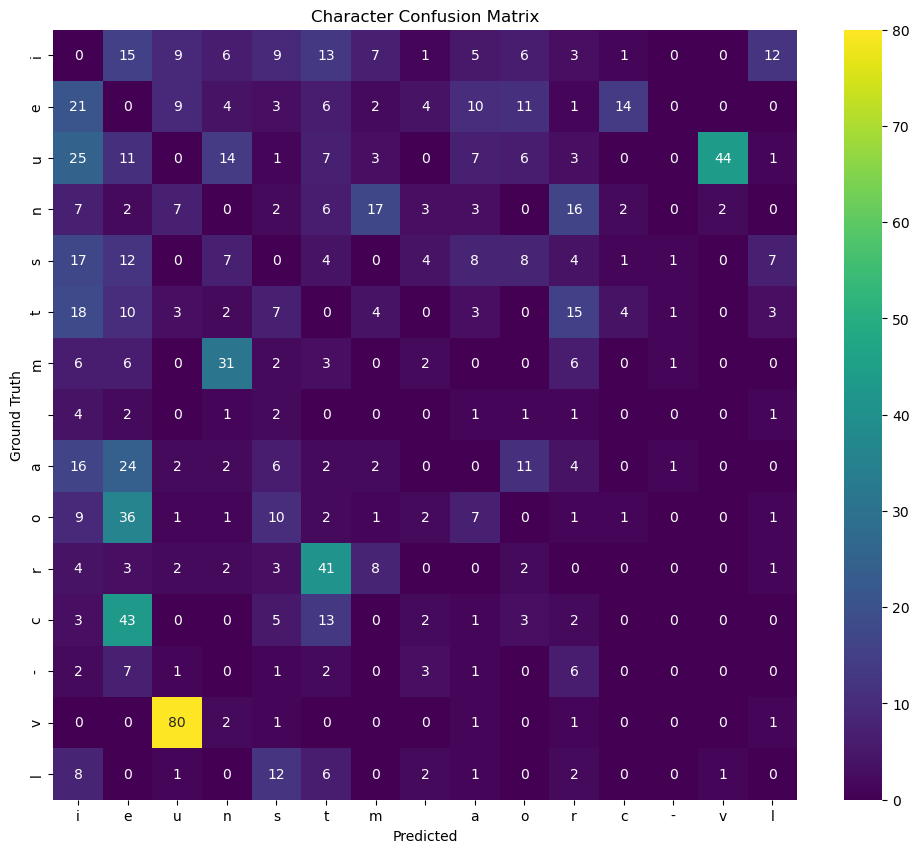

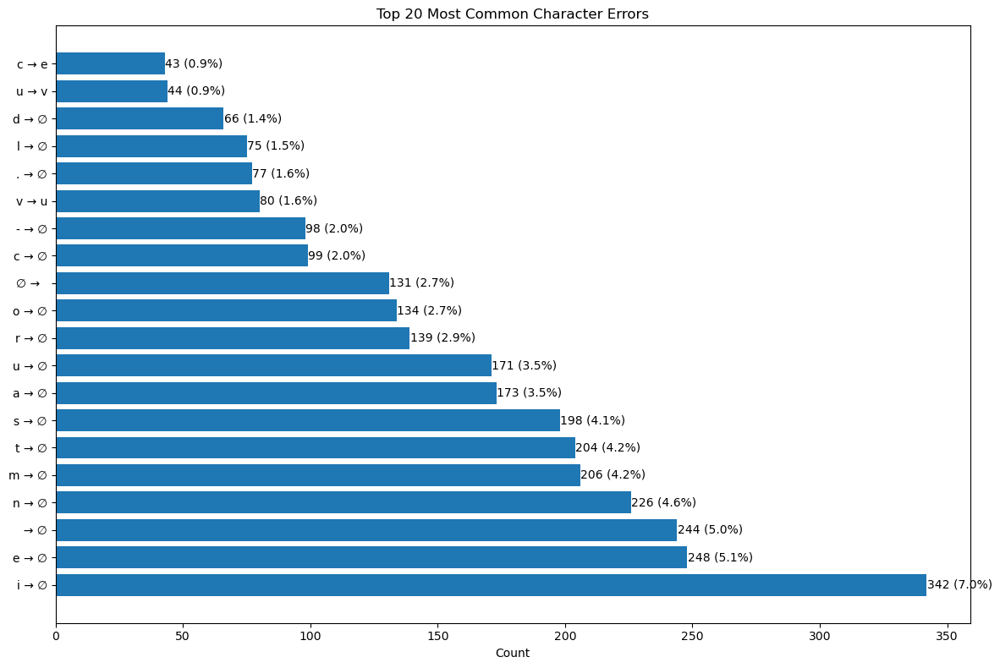

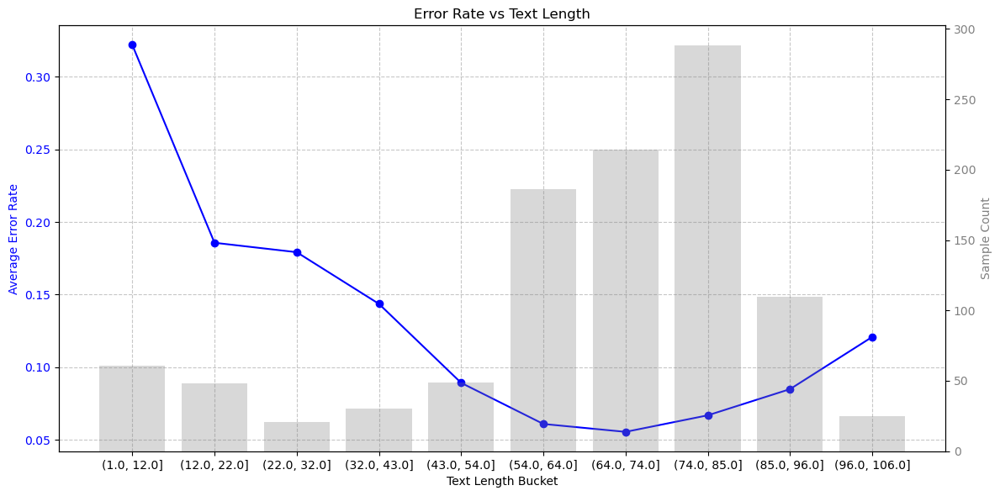

In [15]:
# To compare multiple models
model_paths = [
    #'models/GIELCZ_Exp_raw.mlmodel',
    #'models/GIELCZ_Exp_repol.mlmodel',
    #'models/',
    #'GIELCZ_Exp_repol_mccatmus_union_20.mlmodel',
    #'models/GIELCZ_Exp_repol_mccatmus_new.mlmodel',
    #'models/GIELCZ_Exp_repol_mccatmus_add.mlmodel',
    #'models/fontes_impr_expanded.mlmodel',
    'datasets/fontes_impr_expanded.model_1.mlmodel',
    '/home/krzys/.config/kraken/McCATMuS_nfd_nofix_V1.mlmodel'
]

model_names = [
    #'Raw', 
    #'Repolygonized', 
    # 'FT MCCatmus (GIELCZ) - new',
    'FT MCCatmus (all) - new',
    'MCatmus'
              # 'FT MCCatmus - add', 'FT MCCatmus - new', 'MCCatmus'
              ]

# Create comparator
comparator = ModelComparator(model_paths, model_names)

# Compare summaries
comparison_df = comparator.compare_summary()
display(comparison_df)  # Nice tabular display in Jupyter

# Compare training metrics
try:
    metrics_fig = comparator.compare_training_metrics()
    display(metrics_fig)
except ValueError as e:
    print(f"Could not compare training metrics: {e}")

# Compare on test split
test_comparison = comparator.compare_evaluation_on_arrow(
    arrow_path='datasets/fontes_impr_expanded.arrow',
    split='test'  # Use 'test' split
)

# Show comparison plot
display(test_comparison['plot'])

# Display accuracy comparison table
display(test_comparison['comparison_df'])

# Compare error distributions
error_comparison = comparator.compare_error_distribution(test_comparison)
display(error_comparison['plot'])

# Individual model analysis
# Let's analyze the first model in more detail
print("\n\nDetailed analysis of first model:")
analyzer = comparator.analyzers[0]

# Show confusion matrix for the first model
print("\nGenerating confusion matrix...")
first_model_results = test_comparison['detailed_results'][model_names[0]]
cm_plot = analyzer.plot_confusion_matrix(first_model_results['confusion_matrix'], top_n=15)
display(cm_plot)

# Show error distribution
print("\nPlotting error distribution...")
err_plot = analyzer.plot_error_distribution(first_model_results, top_n=20)
display(err_plot)

# Visualize text length vs. error rate
print("\nPlotting text length vs. error relationship...")
len_plot = analyzer.plot_lengths_vs_errors(first_model_results['results'])
display(len_plot)

### Fine-grained Testing


Analyzing character performance for FT MCCatmus (all) - new...

Character recognition performance:


,occurrences,errors,error_rate,accuracy
i,438,438,1.0,0.0
e,340,340,1.0,0.0
u,298,298,1.0,0.0
n,295,295,1.0,0.0
s,286,286,1.0,0.0
t,277,277,1.0,0.0
m,267,267,1.0,0.0
,265,265,1.0,0.0
a,249,249,1.0,0.0
o,212,212,1.0,0.0


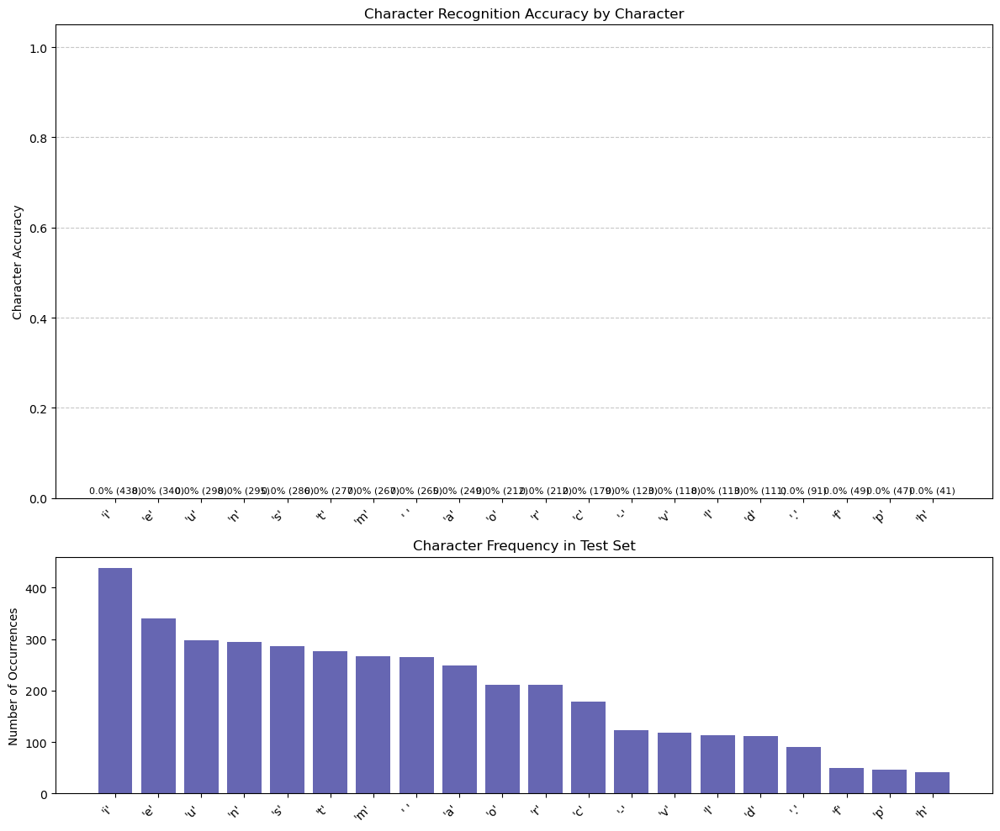


Visualizing sample predictions...


/media/HOME_FOLDERS/krzys/Kod/fontes/htr/output/model_analyzer.py:791: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 27 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


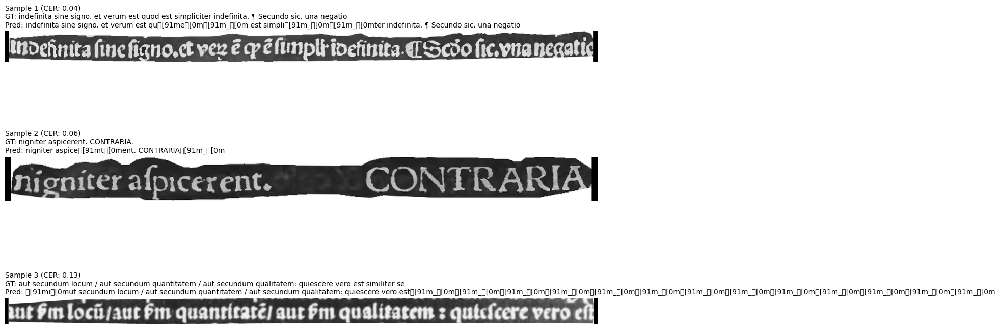

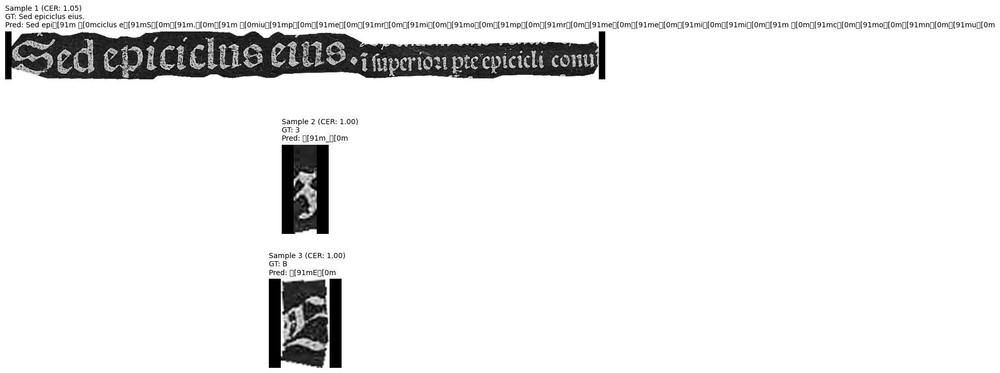

No samples found matching filter criteria. Using random samples.


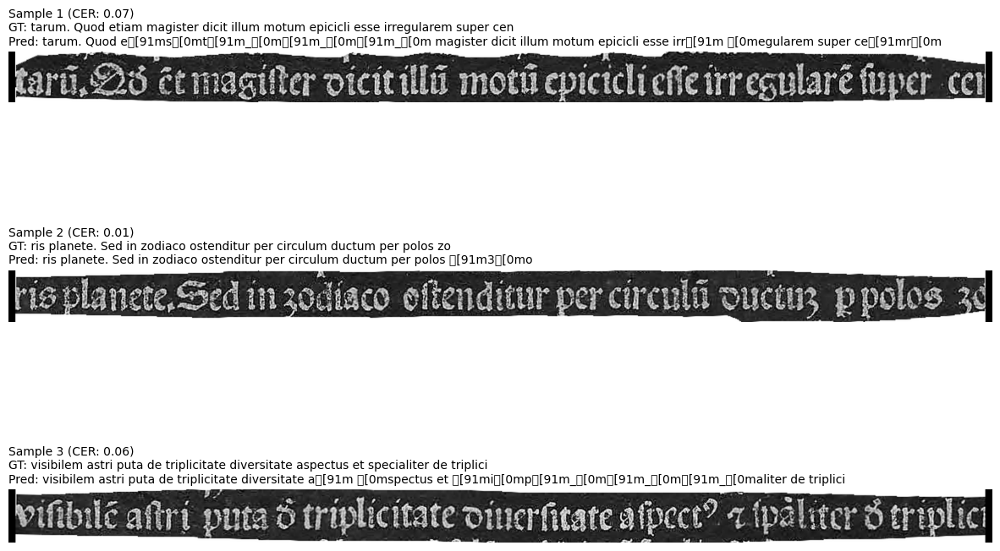

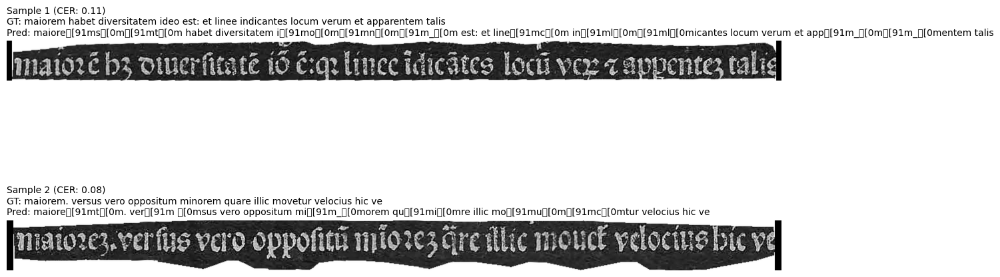


Comparing character performance across models...


NameError: name 'pd' is not defined

/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: Glyph 27 () missing from font(s) DejaVu Sans.
  func(*args, **kwargs)


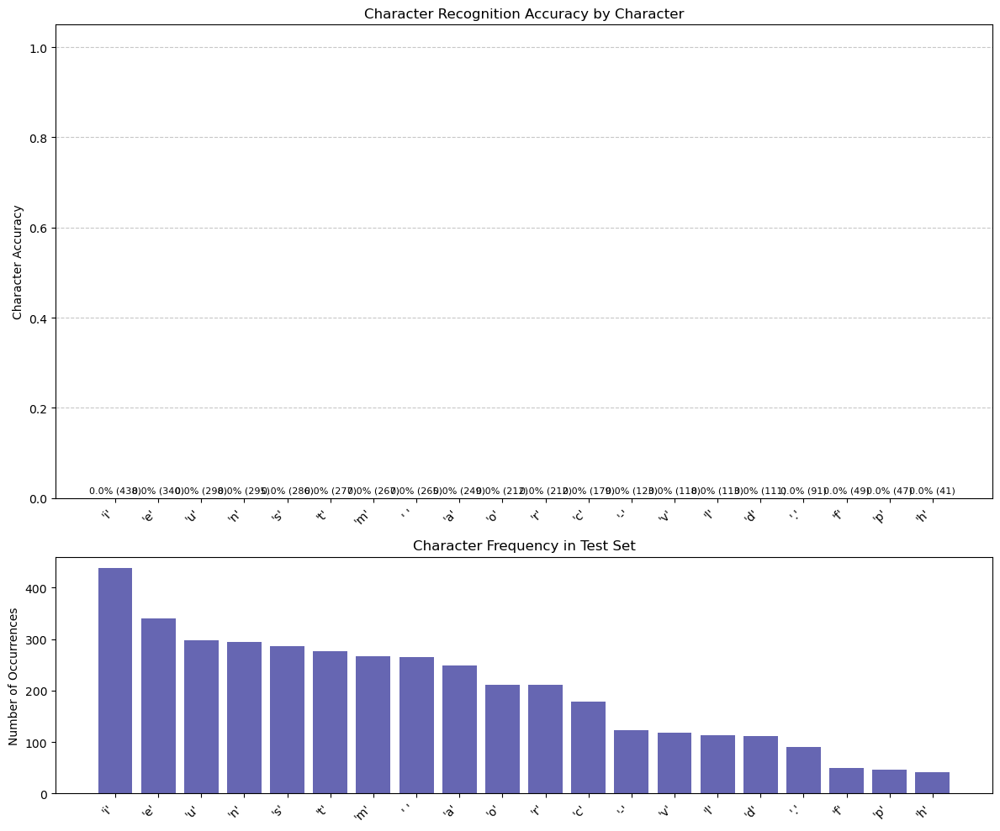

/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 27 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


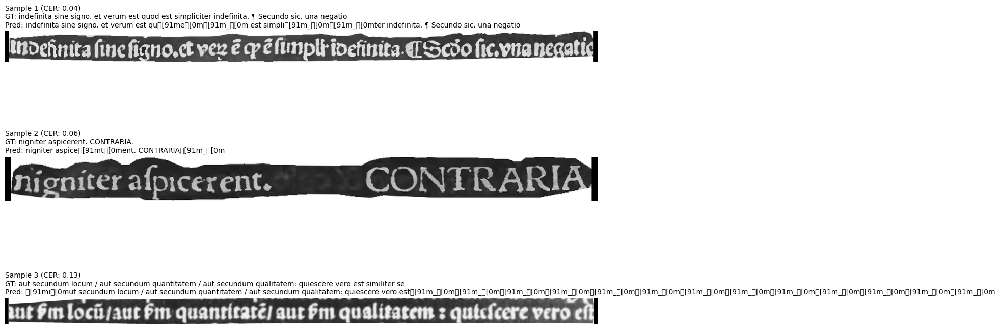

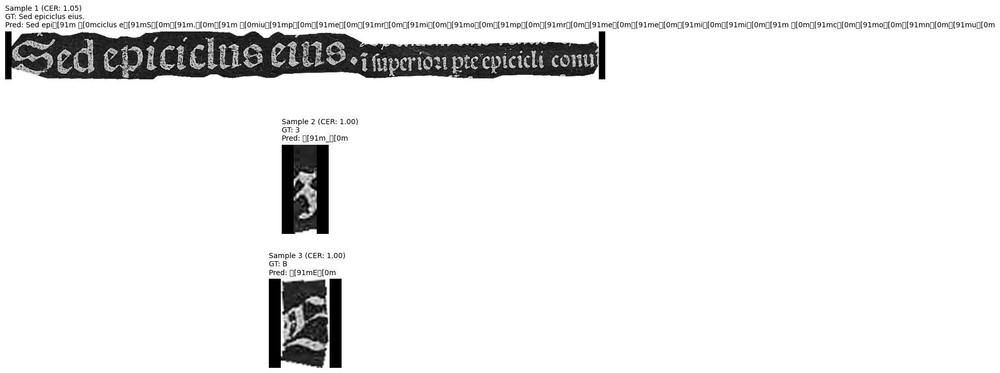

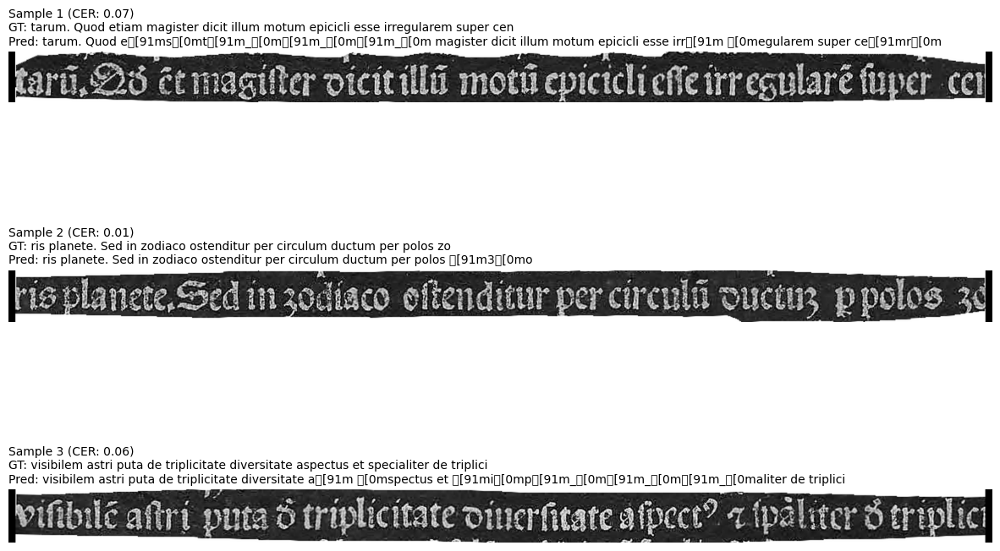

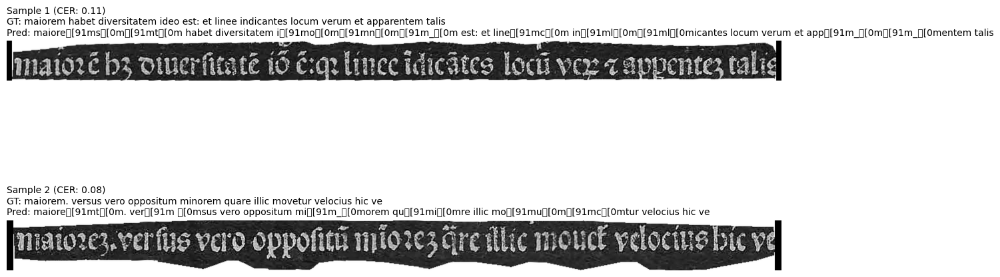

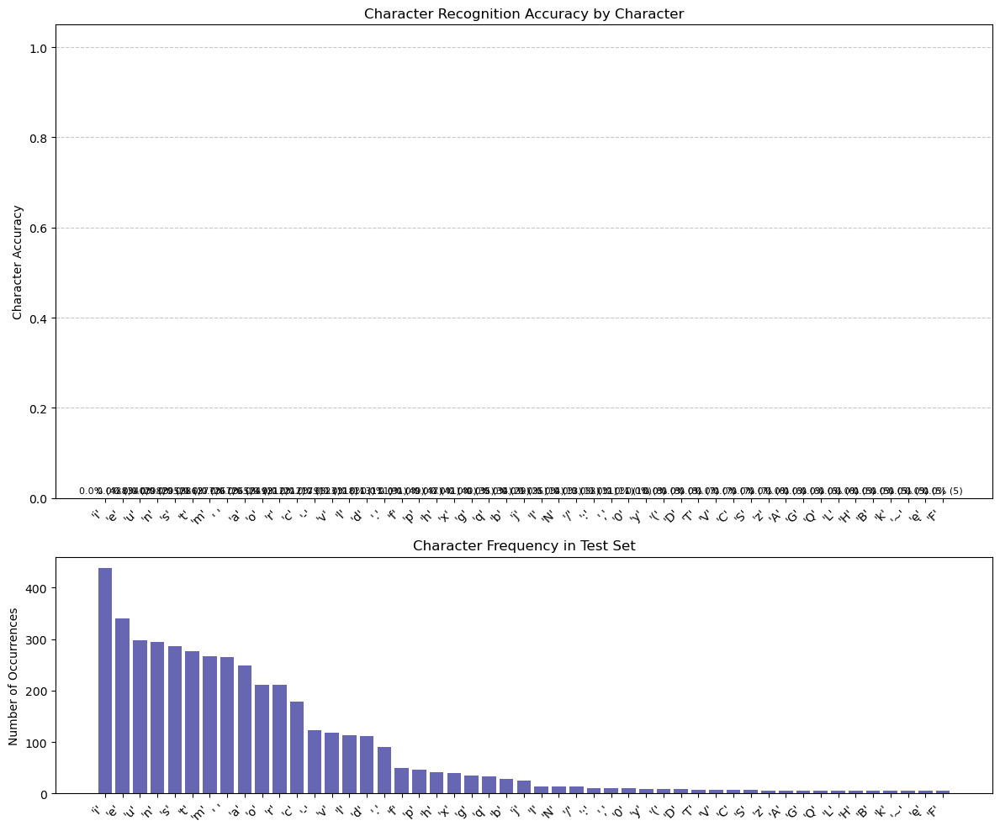

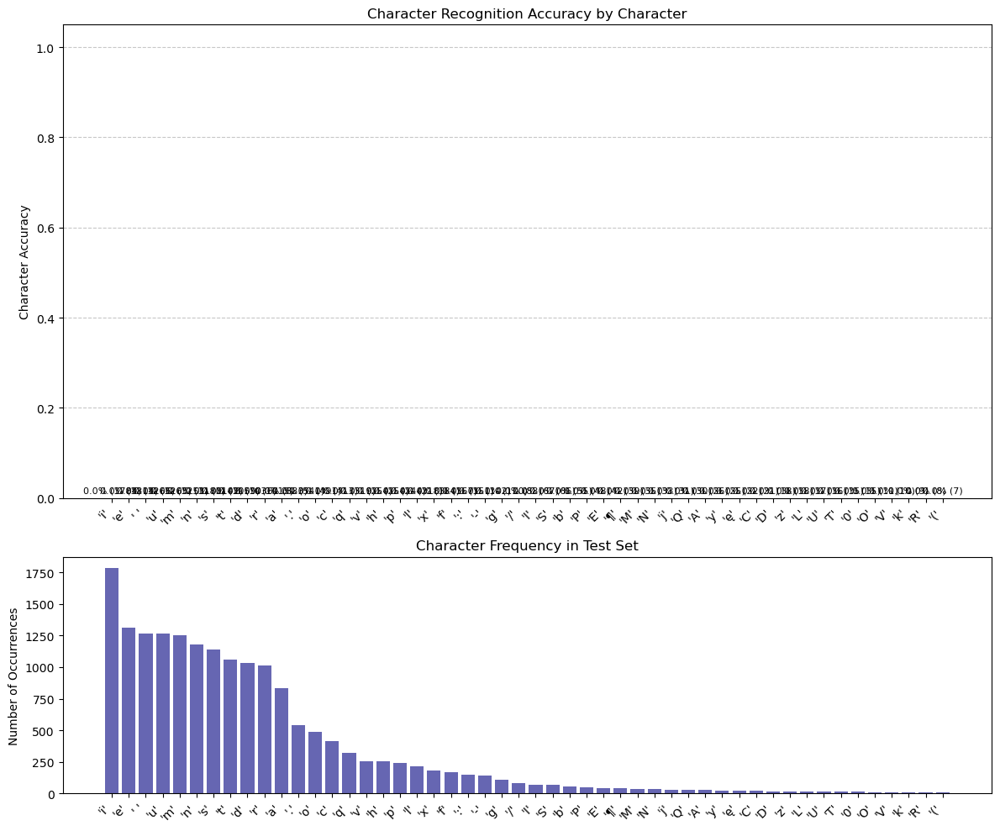

In [16]:
first_model_name = model_names[0]
first_model_results = test_comparison['detailed_results'][first_model_name]

print(f"\nAnalyzing character performance for {first_model_name}...")
char_analysis = comparator.analyzers[0].analyze_character_performance(
    first_model_results,
    top_n=20,  # Show top 20 most frequent characters
    min_occurrences=5  # Only include characters with at least 5 occurrences
)

# Display the character performance data
print("\nCharacter recognition performance:")
display(char_analysis['char_performance_df'])

# Show the visualization
display(char_analysis['plot'])

# 2. Sample Visualization
# Let's look at examples of recognition
print("\nVisualizing sample predictions...")

# 2.1 Random samples
random_samples = comparator.analyzers[0].visualize_samples(
    arrow_path='datasets/fontes_impr_expanded.arrow',
    split='test',
    num_samples=3,
    filter_type='random'
)
display(random_samples['plot'])

# 2.2 Worst performing samples
worst_samples = comparator.analyzers[0].visualize_samples(
    arrow_path='datasets/fontes_impr_expanded.arrow',
    split='test',
    num_samples=3,
    filter_type='worst'
)
display(worst_samples['plot'])

# 2.3 Samples containing a specific character
# For example, samples with the character 'ä'
char_samples = comparator.analyzers[0].visualize_samples(
    arrow_path='datasets/fontes_impr_expanded.arrow',
    split='test',
    num_samples=3,
    filter_type='char',
    filter_value='ä'  # Replace with a character that appears in your dataset
)
display(char_samples['plot'])

# 2.4 Samples with a specific error type
# For example, confusing 'e' with 'c'
error_samples = comparator.analyzers[0].visualize_samples(
    arrow_path='datasets/fontes_impr_expanded.arrow',
    split='test',
    num_samples=3,
    filter_type='error',
    filter_value='e → c'  # Replace with an error that occurs in your models
)
display(error_samples['plot'])

# Comparing character performance across models
print("\nComparing character performance across models...")

# Create a dictionary to store character performance for each model
model_char_performances = {}

for name, analyzer in zip(model_names, comparator.analyzers):
    try:
        results = test_comparison['detailed_results'][name]
        char_analysis = analyzer.analyze_character_performance(
            results, 
            top_n=50,  # Get more characters for comparison
            min_occurrences=5
        )
        model_char_performances[name] = char_analysis['char_performance_df']
    except Exception as e:
        print(f"Could not analyze character performance for {name}: {e}")

# Pick some interesting characters to compare across models
# Combine all DataFrames to find common characters
all_chars = set()
for df in model_char_performances.values():
    all_chars.update(df.index)

# Find characters present in all models
common_chars = set()
for char in all_chars:
    if all(char in df.index for df in model_char_performances.values()):
        common_chars.add(char)

# Select some interesting characters (those with varied performance)
if common_chars:
    # Create comparison DataFrame for the selected characters
    char_comparison = pd.DataFrame()
    
    for char in sorted(common_chars)[:10]:  # Take first 10 common characters
        char_data = {}
        for model_name, df in model_char_performances.items():
            if char in df.index:
                char_data[model_name] = df.loc[char, 'accuracy']
            else:
                char_data[model_name] = None
        
        char_comparison[char] = pd.Series(char_data)
    
    # Display the comparison
    print("\nCharacter recognition accuracy across models:")
    display(char_comparison)
    
    # Create a visualization
    plt.figure(figsize=(12, 8))
    char_comparison.T.plot(kind='bar')
    plt.title('Character Recognition Accuracy Comparison')
    plt.ylabel('Accuracy')
    plt.xlabel('Character')
    plt.legend(title='Model')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    display(plt)
else:
    print("No common characters found across all models.")

# Tests

### Preparing binary datasets

Let's prepare 2 versions of datasets based on raw and repolygonized transkribus files:

In [ ]:
arrow_dataset.build_binary_dataset(files=ground_truth,
                                   output_file='datasets/GIELCZ_Exp.arrow',
                                   format_type='page',
                                   ignore_splits=True,
                                   random_split=(0.8,0.1,0.1))

In [ ]:
arrow_dataset.build_binary_dataset(files=glob.glob('in_ext_repol/GIELCZ_Exp/*.xml'),
                                   output_file='datasets/GIELCZ_Exp_repol.arrow',
                                   format_type='page',
                                   ignore_splits=True,
                                   random_split=(0.8,0.1,0.1))

### Inspecting datasets

Let's now print stats and samples of both datasets

Dataset Metadata:
- type: kraken_recognition_baseline
- text_type: raw
- image_type: raw
- splits: ['train', 'eval', 'test']
- im_mode: RGB
- legacy_polygons: False
- counts: {'all': 907, 'train': 724, 'validation': 92, 'test': 91}
- Alphabet size: 56 unique characters

Total samples: 907

--- TRAIN SPLIT SAMPLES ---
Sample 1 (Index 109):
Text: "nus supponit personaliter. Iy maria materialiter Exemplum secundi ut cuiuslibet"


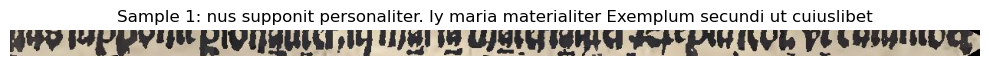

Sample 2 (Index 179):
Text: "Et similiter dicatur de econverso. patet etcetera."


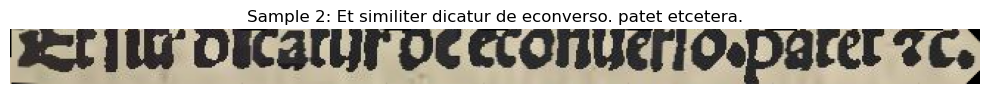

Sample 3 (Index 265):
Text: "confuse tantum. eo que preter negationem inclusam in Iy differt. et preter"


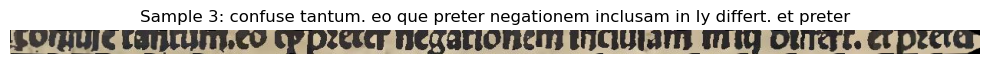

Sample 4 (Index 712):
Text: "verte. quod terminorum singularitas et communitas accipitur ex singularitate et"


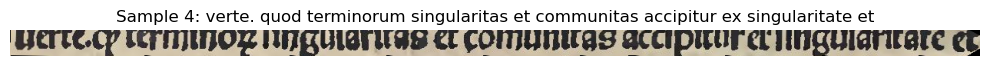

Sample 5 (Index 183):
Text: "lectus. Nam posito casu que antichristus erit et non aduc intellectus con"


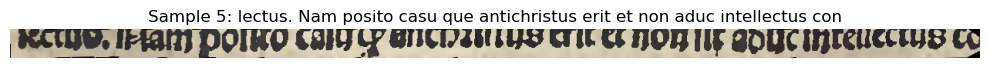


--- VALIDATION SPLIT SAMPLES ---
Sample 1 (Index 550):
Text: "socrates. Iy non socrates est superius sive et melius communius. Iy non homo. cum de"


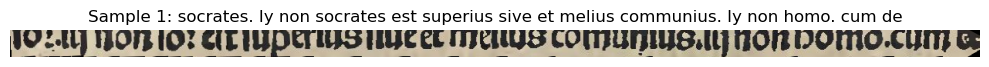

Sample 2 (Index 884):
Text: "tatum. transire immediate in rem. pro qua supponit suum antecedens. et non"


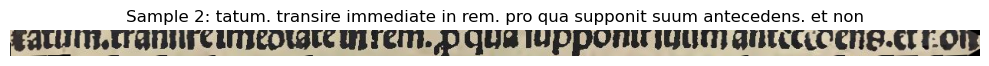

Sample 3 (Index 596):
Text: "asinus est currens. tam Iy asinus quam Iy currens supponit confuse tamen. Et dico no-"


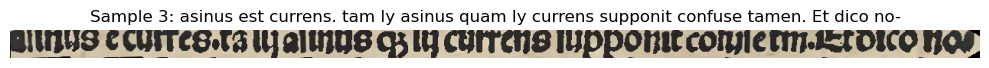

Sample 4 (Index 162):
Text: "substantiam et significant dispositionem accidentalem vel etiam essentialem. ut Iy talis"


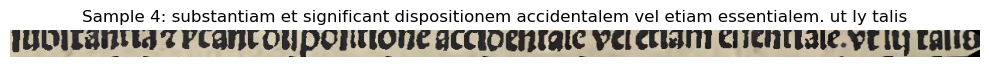

Sample 5 (Index 861):
Text: "tatis modum sigificandi habet ille terminus. talis. ideo oportet dicere socrates est ali-"


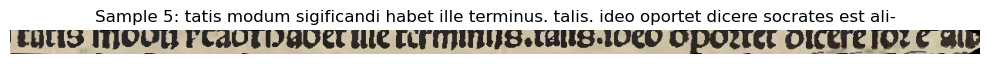


--- TEST SPLIT SAMPLES ---
Sample 1 (Index 122):
Text: "tionato. quia disiuctum supponit eius parte altera supponente. et conditio-"


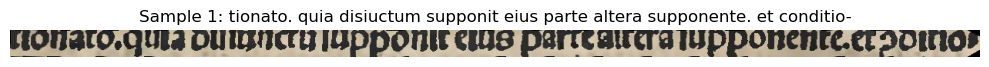

Sample 2 (Index 779):
Text: "kathegreumate determinatus. est simpliciter acceptus. quoniam talis determina-"


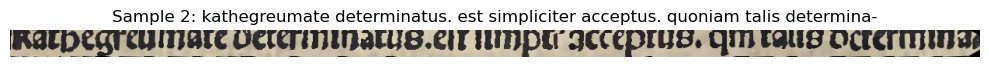

Sample 3 (Index 827):
Text: "Notandum tercio. que de suppositione"


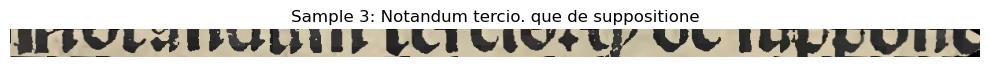

Sample 4 (Index 375):
Text: "precise pro eo pro quo sue partes. ad suppositionem autem conditionali hoc"


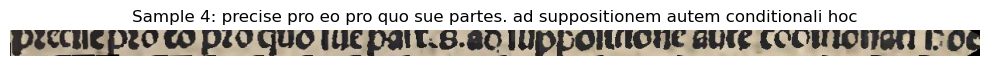

Sample 5 (Index 651):
Text: "rius sub Iy homo quia semper argueretur ab inferiori ad superius in de-"


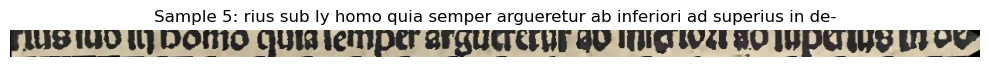

Dataset Metadata:
- type: kraken_recognition_baseline
- text_type: raw
- image_type: raw
- splits: ['train', 'eval', 'test']
- im_mode: RGB
- legacy_polygons: False
- counts: {'all': 882, 'train': 702, 'validation': 94, 'test': 86}
- Alphabet size: 56 unique characters

Total samples: 882

--- TRAIN SPLIT SAMPLES ---
Sample 1 (Index 126):
Text: "potest poni genitivus huius relatini ipse . refert enim possessorem semper"


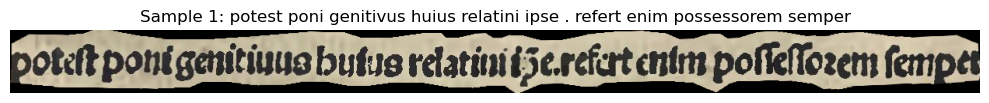

Sample 2 (Index 878):
Text: "eo quod materialiter vel personaliter sumptum potest esse propositionis extremum."


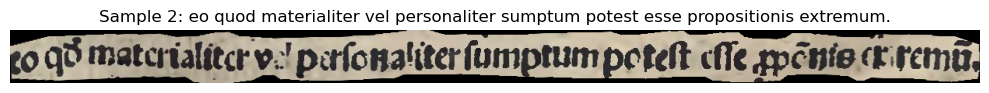

Sample 3 (Index 503):
Text: "id est pro aliquo incommunicabili pluribus. vel sic. est acceptio termini discreti"


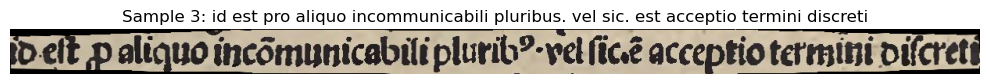

Sample 4 (Index 17):
Text: "copulatiua quam in distinctiva etcetera. super quo quidem modo concipiendi fun-"


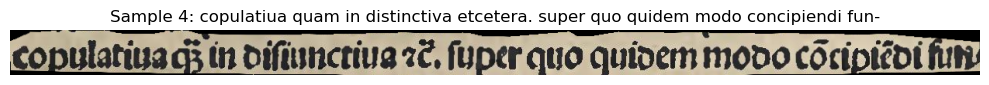

Sample 5 (Index 456):
Text: "ferioribus. s. pro hoc scripto ens vel vocali. similiter pro omnibus mo-"


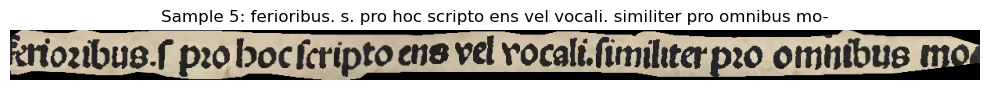


--- VALIDATION SPLIT SAMPLES ---
Sample 1 (Index 434):
Text: "talis terminus verificatur mediante copula talis propositionis. ut hec Sor. est"


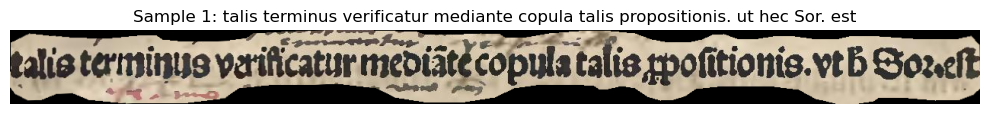

Sample 2 (Index 763):
Text: "sub subiecto eius sic. ergo isti apostoli dei petro et paulo demonstratis. et isti apo-"


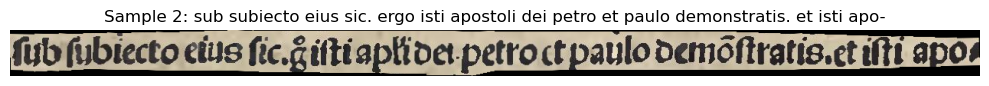

Sample 3 (Index 215):
Text: "socrates. Iy non socrates est superius sive et melius communius. Iy non homo. cum de"


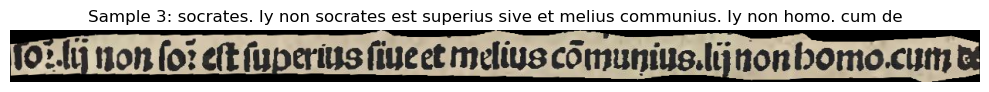

Sample 4 (Index 9):
Text: "cismus. quod ibi est relatio re. et non voce. et fit quoniam relativum refertur ad antecedens"


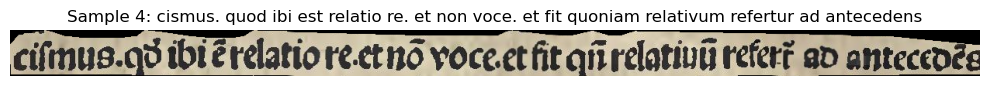

Sample 5 (Index 728):
Text: "greuma connfusivum. subiectum supponens. determinate proprie vel reductive"


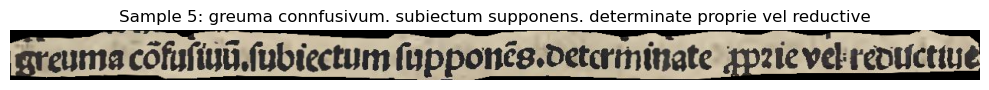


--- TEST SPLIT SAMPLES ---
Sample 1 (Index 191):
Text: "guentur ab inferiori ad superius in supponendo. quia tamen non debet"


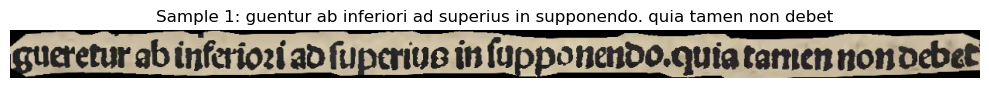

Sample 2 (Index 252):
Text: "kathegreumate distributivo constitutum) facit terminum sequentem immediate"


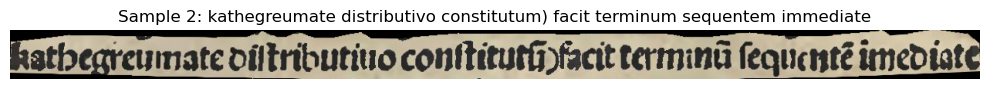

Sample 3 (Index 88):
Text: "stat confuse distributive. quia terminus relativus predicatur precise sup-"


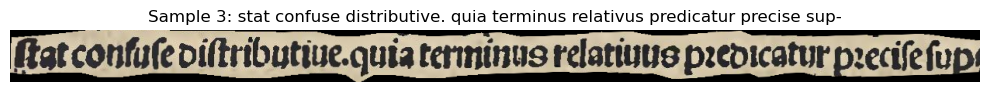

Sample 4 (Index 555):
Text: "non adequate pro eodem supponentibus. est terminus communis. tale enim di-"


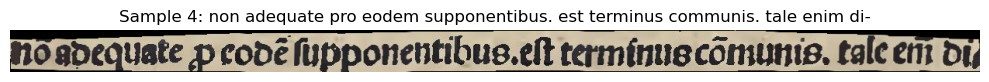

Sample 5 (Index 259):
Text: "ctive tentum. quoniam distributive tentum facit stare terminum confuse distribu-"


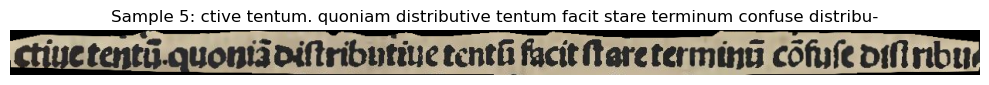

In [4]:
explore_arrow_dataset('datasets/GIELCZ_Exp.arrow', num_samples=5, mode='all')
explore_arrow_dataset('datasets/GIELCZ_Exp_repol.arrow', num_samples=5, mode='all')

## Training

### Setting hyperparameters

In [5]:
hyperparams = kraken.lib.default_specs.RECOGNITION_HYPER_PARAMS
hyperparams.update({"augment" : True})

### Initializing models

In [188]:
model_raw = RecognitionModel(hyper_params=hyperparams,
                         training_data=['datasets/GIELCZ_Exp.arrow'],
                         binary_dataset_split=True,
                         format_type='binary',output="GIELCZ_Exp_raw", num_workers=15)

alphabet mismatch: chars in training set only: {'H', '1', '4', 'F', '=', '(', 'L', ')', '3', 'j', 'K', 'V'} (not included in accuracy test during training)


In [189]:
model_repol = RecognitionModel(hyper_params=hyperparams,
                         training_data=['datasets/GIELCZ_Exp_repol.arrow'],
                         binary_dataset_split=True,
                         format_type='binary',output="GIELCZ_Exp_repol", num_workers=15,)

alphabet mismatch: chars in training set only: {'H', '1', '4', 'F', '=', '(', 'L', 'B', '3', 'j', 'K', 'V', 'G'} (not included in accuracy test during training)


In [190]:
model_repol_mccatmus_union = RecognitionModel(model='models/McCATMuS_nfd_nofix_V1.mlmodel',
                                        resize='union', # strategies for unknown chars: 'fail', 'both', 'new', 'add', 'union'
                         hyper_params=hyperparams,
                         training_data=['datasets/GIELCZ_Exp_repol.arrow'],
                         binary_dataset_split=True,
                         format_type='binary', num_workers=15,output="GIELCZ_Exp_repol_mccatmus_union")

alphabet mismatch: chars in training set only: {'H', '1', '4', 'F', '=', '(', 'L', 'B', '3', 'j', 'K', 'V', 'G'} (not included in accuracy test during training)


In [191]:
model_repol_mccatmus_new = RecognitionModel(model='models/McCATMuS_nfd_nofix_V1.mlmodel',
                                        resize='new', # strategies for unknown chars: 'fail', 'both', 'new', 'add', 'union'
                         hyper_params=hyperparams,
                         training_data=['datasets/GIELCZ_Exp_repol.arrow'],
                         binary_dataset_split=True,
                         format_type='binary', num_workers=15,output="GIELCZ_Exp_repol_mccatmus_new")

alphabet mismatch: chars in training set only: {'H', '1', '4', 'F', '=', '(', 'L', 'B', '3', 'j', 'K', 'V', 'G'} (not included in accuracy test during training)


In [192]:
model_repol_mccatmus_add = RecognitionModel(model='models/McCATMuS_nfd_nofix_V1.mlmodel',
                                        resize='add', # strategies for unknown chars: 'fail', 'both', 'new', 'add', 'union'
                         hyper_params=hyperparams,
                         training_data=['datasets/GIELCZ_Exp_repol.arrow'],
                         binary_dataset_split=True,
                         format_type='binary', num_workers=15,output="GIELCZ_Exp_repol_mccatmus_add")

alphabet mismatch: chars in training set only: {'H', '1', '4', 'F', '=', '(', 'L', 'B', '3', 'j', 'K', 'V', 'G'} (not included in accuracy test during training)


### Fitting

In [ ]:
trainer_raw = KrakenTrainer()
trainer_repol = KrakenTrainer()
trainer_raw.fit(model_raw)
trainer_repol.fit(model_repol)

In [193]:
trainer_repol_mccatmus_union = KrakenTrainer()
trainer_repol_mccatmus_union.fit(model_repol_mccatmus_union)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃    ┃ Name      ┃ Type                     ┃ Params ┃ Mode  ┃                 In sizes ┃               Out sizes ┃
┡━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ 0  │ val_cer   │ CharErrorRate            │      0 │ train │                        ? │                       ? │
│ 1  │ val_wer   │ WordErrorRate            │      0 │ train │                        ? │                       ? │
│ 2  │ net       │ MultiParamSequential     │  4.0 M │ train │  [[1, 1, 120, 400], '?'] │  [[1, 118, 1, 50], '?'] │
│ 3  │ net.C_0   │ ActConv2D                │  1.3 K │ train │  [[1, 1, 120, 400], '?', │     [[1, 32, 120, 400], │
│    │           │                          │        │       │                     '?'] │                    '?'] │
│ 4  │ net.Do_1  │ Dropout                  │      0 │ train │ [[1, 32, 120, 400], '?', │     [[1, 32, 120, 400], │
│    │           │                          │        │       │                     '?'] │                    '?'] │
│ 5  │ net.Mp_2  │ MaxPool                  │      0 │ train │ [[1, 32, 120, 400], '?', │ [[1, 32, 60, 200], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 6  │ net.C_3   │ ActConv2D                │ 40.0 K │ train │  [[1, 32, 60, 200], '?', │ [[1, 32, 60, 200], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 7  │ net.Do_4  │ Dropout                  │      0 │ train │  [[1, 32, 60, 200], '?', │ [[1, 32, 60, 200], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 8  │ net.Mp_5  │ MaxPool                  │      0 │ train │  [[1, 32, 60, 200], '?', │ [[1, 32, 30, 100], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 9  │ net.C_6   │ ActConv2D                │ 55.4 K │ train │  [[1, 32, 30, 100], '?', │ [[1, 64, 30, 100], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 10 │ net.Do_7  │ Dropout                  │      0 │ train │  [[1, 64, 30, 100], '?', │ [[1, 64, 30, 100], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 11 │ net.Mp_8  │ MaxPool                  │      0 │ train │  [[1, 64, 30, 100], '?', │  [[1, 64, 15, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 12 │ net.C_9   │ ActConv2D                │  110 K │ train │   [[1, 64, 15, 50], '?', │  [[1, 64, 15, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 13 │ net.Do_10 │ Dropout                  │      0 │ train │   [[1, 64, 15, 50], '?', │  [[1, 64, 15, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 14 │ net.S_11  │ Reshape                  │      0 │ train │   [[1, 64, 15, 50], '?', │  [[1, 960, 1, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 15 │ net.L_12  │ TransposedSummarizingRNN │  1.9 M │ train │   [[1, 960, 1, 50], '?', │  [[1, 400, 1, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 16 │ net.Do_13 │ Dropout                  │      0 │ train │   [[1, 400, 1, 50], '?', │  [[1, 400, 1, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 17 │ net.L_14  │ TransposedSummarizingRNN │  963 K │ t

Trainable params: 4.0 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 4.0 M                                                                                                
Total estimated model params size (MB): 16                                                                         
Modules in train mode: 40                                                                                          
Modules in eval mode: 0

Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by 
doing `Trainer(logger=ALogger(...))`

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('val_accuracy', ..., logger=True)` but have no logger configured. You can enable one by 
doing `Trainer(logger=ALogger(...))`

/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('val_word_accuracy', ..., logger=True)` but have no logger configured. You can enable one 
by doing `Trainer(logger=ALogger(...))`

/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('val_metric', ..., logger=True)` but have no logger configured. You can enable one by 
doing `Trainer(logger=ALogger(...))`

Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


In [ ]:
trainer_repol_mccatmus_new = KrakenTrainer()
trainer_repol_mccatmus_new.fit(model_repol_mccatmus_new)

In [ ]:
trainer_repol_mccatmus_add = KrakenTrainer()
trainer_repol_mccatmus_add.fit(model_repol_mccatmus_add)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃    ┃ Name      ┃ Type                     ┃ Params ┃ Mode  ┃                 In sizes ┃               Out sizes ┃
┡━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ 0  │ val_cer   │ CharErrorRate            │      0 │ train │                        ? │                       ? │
│ 1  │ val_wer   │ WordErrorRate            │      0 │ train │                        ? │                       ? │
│ 2  │ net       │ MultiParamSequential     │  4.0 M │ train │  [[1, 1, 120, 400], '?'] │  [[1, 118, 1, 50], '?'] │
│ 3  │ net.C_0   │ ActConv2D                │  1.3 K │ train │  [[1, 1, 120, 400], '?', │     [[1, 32, 120, 400], │
│    │           │                          │        │       │                     '?'] │                    '?'] │
│ 4  │ net.Do_1  │ Dropout                  │      0 │ train │ [[1, 32, 120, 400], '?', │     [[1, 32, 120, 400], │
│    │           │                          │        │       │                     '?'] │                    '?'] │
│ 5  │ net.Mp_2  │ MaxPool                  │      0 │ train │ [[1, 32, 120, 400], '?', │ [[1, 32, 60, 200], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 6  │ net.C_3   │ ActConv2D                │ 40.0 K │ train │  [[1, 32, 60, 200], '?', │ [[1, 32, 60, 200], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 7  │ net.Do_4  │ Dropout                  │      0 │ train │  [[1, 32, 60, 200], '?', │ [[1, 32, 60, 200], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 8  │ net.Mp_5  │ MaxPool                  │      0 │ train │  [[1, 32, 60, 200], '?', │ [[1, 32, 30, 100], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 9  │ net.C_6   │ ActConv2D                │ 55.4 K │ train │  [[1, 32, 30, 100], '?', │ [[1, 64, 30, 100], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 10 │ net.Do_7  │ Dropout                  │      0 │ train │  [[1, 64, 30, 100], '?', │ [[1, 64, 30, 100], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 11 │ net.Mp_8  │ MaxPool                  │      0 │ train │  [[1, 64, 30, 100], '?', │  [[1, 64, 15, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 12 │ net.C_9   │ ActConv2D                │  110 K │ train │   [[1, 64, 15, 50], '?', │  [[1, 64, 15, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 13 │ net.Do_10 │ Dropout                  │      0 │ train │   [[1, 64, 15, 50], '?', │  [[1, 64, 15, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 14 │ net.S_11  │ Reshape                  │      0 │ train │   [[1, 64, 15, 50], '?', │  [[1, 960, 1, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 15 │ net.L_12  │ TransposedSummarizingRNN │  1.9 M │ train │   [[1, 960, 1, 50], '?', │  [[1, 400, 1, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 16 │ net.Do_13 │ Dropout                  │      0 │ train │   [[1, 400, 1, 50], '?', │  [[1, 400, 1, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 17 │ net.L_14  │ TransposedSummarizingRNN │  963 K │ t

Trainable params: 4.0 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 4.0 M                                                                                                
Total estimated model params size (MB): 16                                                                         
Modules in train mode: 40                                                                                          
Modules in eval mode: 0

Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by 
doing `Trainer(logger=ALogger(...))`

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('val_accuracy', ..., logger=True)` but have no logger configured. You can enable one by 
doing `Trainer(logger=ALogger(...))`

/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('val_word_accuracy', ..., logger=True)` but have no logger configured. You can enable one 
by doing `Trainer(logger=ALogger(...))`

/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('val_metric', ..., logger=True)` but have no logger configured. You can enable one by 
doing `Trainer(logger=ALogger(...))`

Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃    ┃ Name      ┃ Type                     ┃ Params ┃ Mode  ┃                 In sizes ┃               Out sizes ┃
┡━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ 0  │ val_cer   │ CharErrorRate            │      0 │ train │                        ? │                       ? │
│ 1  │ val_wer   │ WordErrorRate            │      0 │ train │                        ? │                       ? │
│ 2  │ net       │ MultiParamSequential     │  4.0 M │ train │  [[1, 1, 120, 400], '?'] │   [[1, 56, 1, 50], '?'] │
│ 3  │ net.C_0   │ ActConv2D                │  1.3 K │ train │  [[1, 1, 120, 400], '?', │     [[1, 32, 120, 400], │
│    │           │                          │        │       │                     '?'] │                    '?'] │
│ 4  │ net.Do_1  │ Dropout                  │      0 │ train │ [[1, 32, 120, 400], '?', │     [[1, 32, 120, 400], │
│    │           │                          │        │       │                     '?'] │                    '?'] │
│ 5  │ net.Mp_2  │ MaxPool                  │      0 │ train │ [[1, 32, 120, 400], '?', │ [[1, 32, 60, 200], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 6  │ net.C_3   │ ActConv2D                │ 40.0 K │ train │  [[1, 32, 60, 200], '?', │ [[1, 32, 60, 200], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 7  │ net.Do_4  │ Dropout                  │      0 │ train │  [[1, 32, 60, 200], '?', │ [[1, 32, 60, 200], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 8  │ net.Mp_5  │ MaxPool                  │      0 │ train │  [[1, 32, 60, 200], '?', │ [[1, 32, 30, 100], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 9  │ net.C_6   │ ActConv2D                │ 55.4 K │ train │  [[1, 32, 30, 100], '?', │ [[1, 64, 30, 100], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 10 │ net.Do_7  │ Dropout                  │      0 │ train │  [[1, 64, 30, 100], '?', │ [[1, 64, 30, 100], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 11 │ net.Mp_8  │ MaxPool                  │      0 │ train │  [[1, 64, 30, 100], '?', │  [[1, 64, 15, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 12 │ net.C_9   │ ActConv2D                │  110 K │ train │   [[1, 64, 15, 50], '?', │  [[1, 64, 15, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 13 │ net.Do_10 │ Dropout                  │      0 │ train │   [[1, 64, 15, 50], '?', │  [[1, 64, 15, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 14 │ net.S_11  │ Reshape                  │      0 │ train │   [[1, 64, 15, 50], '?', │  [[1, 960, 1, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 15 │ net.L_12  │ TransposedSummarizingRNN │  1.9 M │ train │   [[1, 960, 1, 50], '?', │  [[1, 400, 1, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 16 │ net.Do_13 │ Dropout                  │      0 │ train │   [[1, 400, 1, 50], '?', │  [[1, 400, 1, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 17 │ net.L_14  │ TransposedSummarizingRNN │  963 K │ t

Trainable params: 4.0 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 4.0 M                                                                                                
Total estimated model params size (MB): 16                                                                         
Modules in train mode: 40                                                                                          
Modules in eval mode: 0

Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by 
doing `Trainer(logger=ALogger(...))`

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('val_accuracy', ..., logger=True)` but have no logger configured. You can enable one by 
doing `Trainer(logger=ALogger(...))`

/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('val_word_accuracy', ..., logger=True)` but have no logger configured. You can enable one 
by doing `Trainer(logger=ALogger(...))`

/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('val_metric', ..., logger=True)` but have no logger configured. You can enable one by 
doing `Trainer(logger=ALogger(...))`

Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃    ┃ Name      ┃ Type                     ┃ Params ┃ Mode  ┃                 In sizes ┃               Out sizes ┃
┡━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ 0  │ val_cer   │ CharErrorRate            │      0 │ train │                        ? │                       ? │
│ 1  │ val_wer   │ WordErrorRate            │      0 │ train │                        ? │                       ? │
│ 2  │ net       │ MultiParamSequential     │  4.0 M │ train │  [[1, 1, 120, 400], '?'] │  [[1, 118, 1, 50], '?'] │
│ 3  │ net.C_0   │ ActConv2D                │  1.3 K │ train │  [[1, 1, 120, 400], '?', │     [[1, 32, 120, 400], │
│    │           │                          │        │       │                     '?'] │                    '?'] │
│ 4  │ net.Do_1  │ Dropout                  │      0 │ train │ [[1, 32, 120, 400], '?', │     [[1, 32, 120, 400], │
│    │           │                          │        │       │                     '?'] │                    '?'] │
│ 5  │ net.Mp_2  │ MaxPool                  │      0 │ train │ [[1, 32, 120, 400], '?', │ [[1, 32, 60, 200], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 6  │ net.C_3   │ ActConv2D                │ 40.0 K │ train │  [[1, 32, 60, 200], '?', │ [[1, 32, 60, 200], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 7  │ net.Do_4  │ Dropout                  │      0 │ train │  [[1, 32, 60, 200], '?', │ [[1, 32, 60, 200], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 8  │ net.Mp_5  │ MaxPool                  │      0 │ train │  [[1, 32, 60, 200], '?', │ [[1, 32, 30, 100], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 9  │ net.C_6   │ ActConv2D                │ 55.4 K │ train │  [[1, 32, 30, 100], '?', │ [[1, 64, 30, 100], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 10 │ net.Do_7  │ Dropout                  │      0 │ train │  [[1, 64, 30, 100], '?', │ [[1, 64, 30, 100], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 11 │ net.Mp_8  │ MaxPool                  │      0 │ train │  [[1, 64, 30, 100], '?', │  [[1, 64, 15, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 12 │ net.C_9   │ ActConv2D                │  110 K │ train │   [[1, 64, 15, 50], '?', │  [[1, 64, 15, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 13 │ net.Do_10 │ Dropout                  │      0 │ train │   [[1, 64, 15, 50], '?', │  [[1, 64, 15, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 14 │ net.S_11  │ Reshape                  │      0 │ train │   [[1, 64, 15, 50], '?', │  [[1, 960, 1, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 15 │ net.L_12  │ TransposedSummarizingRNN │  1.9 M │ train │   [[1, 960, 1, 50], '?', │  [[1, 400, 1, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 16 │ net.Do_13 │ Dropout                  │      0 │ train │   [[1, 400, 1, 50], '?', │  [[1, 400, 1, 50], '?'] │
│    │           │                          │        │       │                     '?'] │                         │
│ 17 │ net.L_14  │ TransposedSummarizingRNN │  963 K │ t

Trainable params: 4.0 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 4.0 M                                                                                                
Total estimated model params size (MB): 16                                                                         
Modules in train mode: 40                                                                                          
Modules in eval mode: 0

Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by 
doing `Trainer(logger=ALogger(...))`

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('val_accuracy', ..., logger=True)` but have no logger configured. You can enable one by 
doing `Trainer(logger=ALogger(...))`

/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('val_word_accuracy', ..., logger=True)` but have no logger configured. You can enable one 
by doing `Trainer(logger=ALogger(...))`

/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/lightning/pytorch/core/module.py:5
16: You called `self.log('val_metric', ..., logger=True)` but have no logger configured. You can enable one by 
doing `Trainer(logger=ALogger(...))`

Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


Output()

Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42
Seed set to 42


In [ ]:
model_raw.nn.save_model('models/GIELCZ_Exp_raw.mlmodel')
model_repol.nn.save_model('models/GIELCZ_Exp_repol.mlmodel')

In [ ]:
#model_repol_mccatmus_union.nn.save_model('models/GIELCZ_Exp_repol_mccatmus_union.mlmodel')
#model_repol_mccatmus_new.nn.save_model('models/GIELCZ_Exp_repol_mccatmus_new.mlmodel')
#model_repol_mccatmus_add.nn.save_model('models/GIELCZ_Exp_repol_mccatmus_add.mlmodel')
#import shutil
# Copy the best model to your desired location
#shutil.copy(model_repol_mccatmus_add.best_model, 'models/GIELCZ_Exp_repol_mccatmus_union.mlmodel')

## Evaluation

### Inspecting model and the validation data

In [128]:
# kraken methods
# https://github.com/mittagessen/kraken/blob/ba1ce5657d8b0451f182f4e83ab78814b8e0de13/kraken/ketos/segmentation.py#L424

In [1]:
from model_analyzer import HTRModelAnalyzer, ModelComparator

{'model_path': 'models/GIELCZ_Exp_raw.mlmodel', 'spec': '[1,120,0,1 Cr{C_0}3,13,32 Do{Do_1}0.1,2 Mp{Mp_2}2,2 Cr{C_3}3,13,32 Do{Do_4}0.1,2 Mp{Mp_5}2,2 Cr{C_6}3,9,64 Do{Do_7}0.1,2 Mp{Mp_8}2,2 Cr{C_9}3,9,64 Do{Do_10}0.1,2 S{S_11}1(1x0)1,3 Lbx{L_12}200 Do{Do_13}0.1,2 Lbx{L_14}200 Do{Do_15}0.1,2 Lbx{L_16}200 Do{Do_17} O{O_18}1c57]', 'model_type': 'recognition', 'alphabet_size': 56, 'completed_epochs': 30, 'best_val_accuracy': np.float64(0.04038381576538086), 'final_val_accuracy': np.float64(0.015179693698883057), 'input_shape': '1x1x120x0'}


<Figure size 1400x800 with 0 Axes>

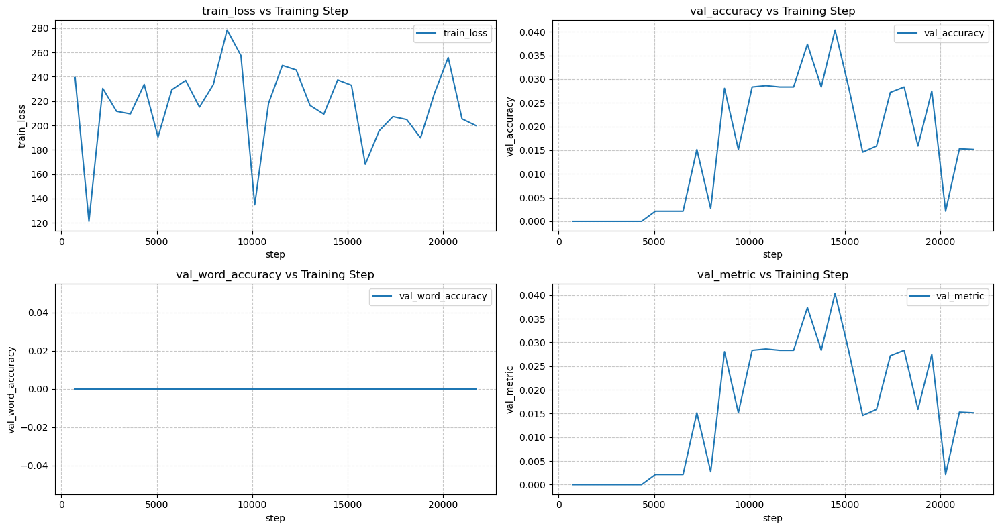

In [4]:
analyzer = HTRModelAnalyzer('models/GIELCZ_Exp_raw.mlmodel')
summary = analyzer.summary()
print(summary)
fig = analyzer.plot_training_metrics()

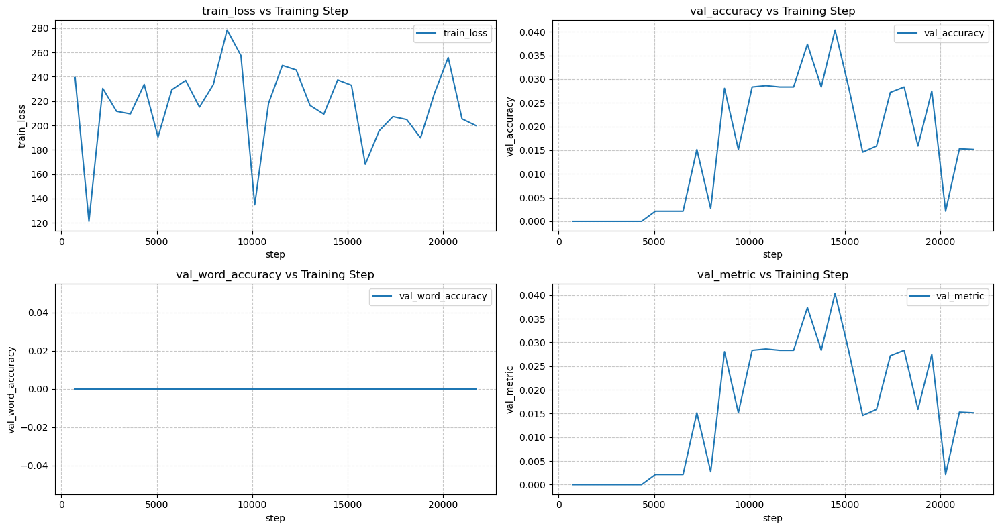

<Figure size 1400x800 with 0 Axes>

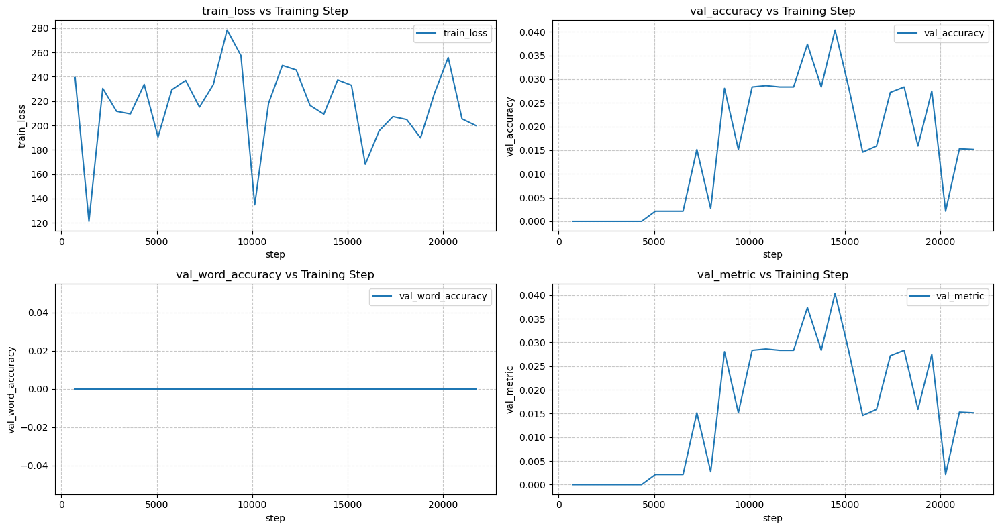

In [6]:
# Plot training metrics
try:
    fig = analyzer.plot_training_metrics()
    display(fig)
except ValueError as e:
    print(f"Could not plot training metrics: {e}")

In [7]:
# Evaluate on validation split from your Arrow dataset
validation_results = analyzer.evaluate_on_arrow_dataset(
    arrow_path='datasets/GIELCZ_Exp.arrow', 
    split='validation',  # Use 'validation' split
    batch_size=16
)

Loading dataset from datasets/GIELCZ_Exp.arrow (split: validation)
Loaded 92 samples
Evaluating model on 92 samples...


Evaluating GIELCZ_Exp_raw.mlmodel:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluation complete: CER=0.9848, Accuracy=0.0152 (6983 characters)


Character Error Rate: 0.9848
Accuracy: 0.0152
Total characters: 6983


/tmp/ipykernel_71545/659213596.py:8: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  error_fig.show()
/tmp/ipykernel_71545/659213596.py:12: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  confusion_fig.show()
/media/HOME_FOLDERS/krzys/Kod/fontes/htr/output/model_analyzer.py:460: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  length_stats = results_df.groupby('length_bucket').agg(
/tmp/ipykernel_71545/659213596.py:16: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  length_fig.show()


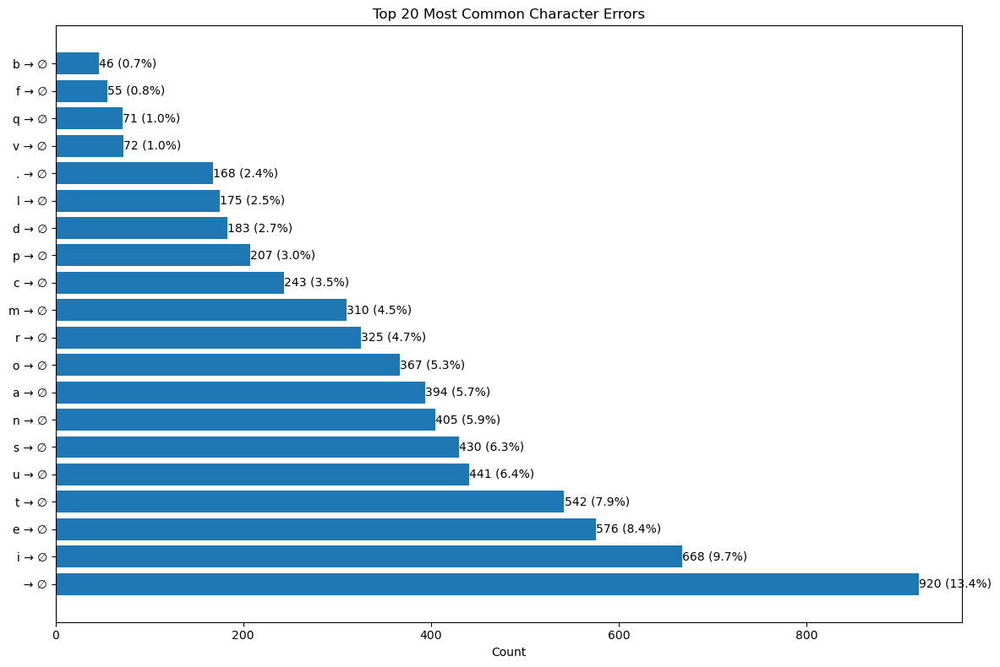

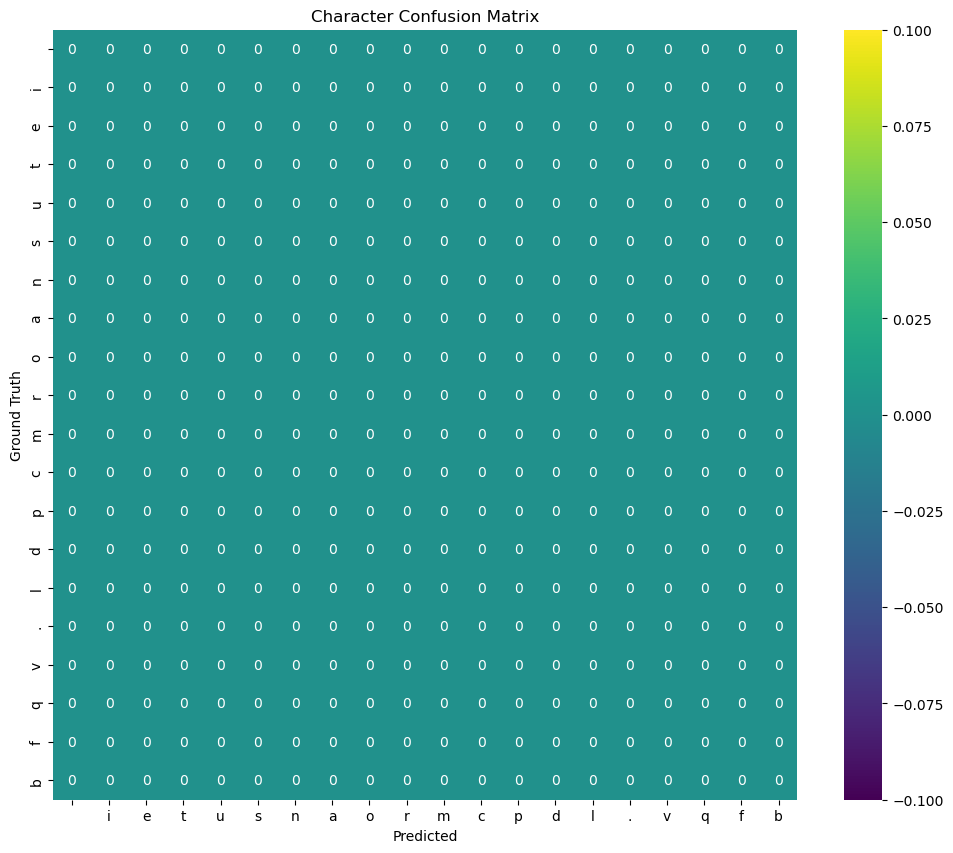

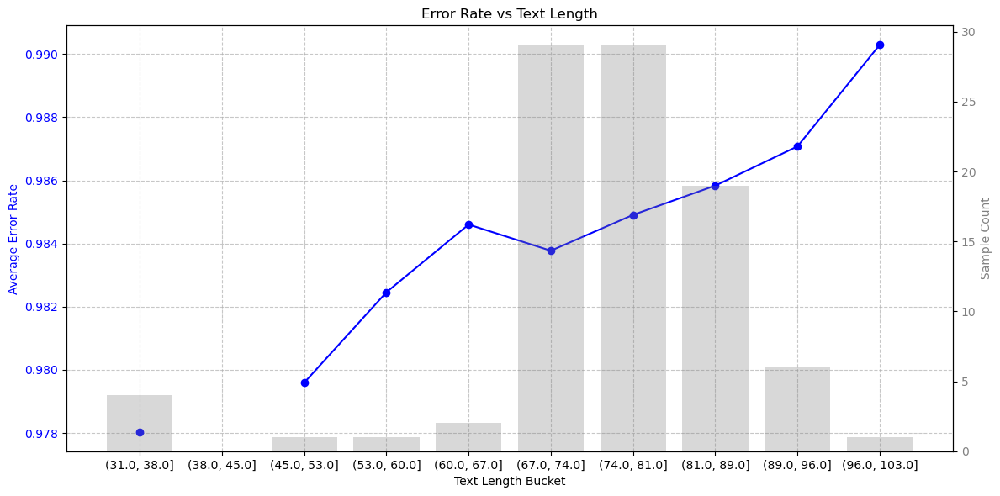

In [8]:
# Show metrics
print(f"Character Error Rate: {validation_results['char_error_rate']:.4f}")
print(f"Accuracy: {validation_results['accuracy']:.4f}")
print(f"Total characters: {validation_results['total_chars']}")

# Plot error distribution 
error_fig = analyzer.plot_error_distribution(validation_results)
error_fig.show()

# Plot confusion matrix
confusion_fig = analyzer.plot_confusion_matrix(validation_results['confusion_matrix'])
confusion_fig.show()

# Plot relation between text length and error rate
length_fig = analyzer.plot_lengths_vs_errors(validation_results['results'])
length_fig.show()

In [9]:
# To compare multiple models
model_paths = [
    #'models/GIELCZ_Exp_raw.mlmodel',
    #'models/GIELCZ_Exp_repol.mlmodel',
    'models/GIELCZ_Exp_repol_mccatmus_union.mlmodel',
    #'GIELCZ_Exp_repol_mccatmus_union_20.mlmodel',
    'models/GIELCZ_Exp_repol_mccatmus_add.mlmodel',
    #'models/GIELCZ_Exp_repol_mccatmus_add.mlmodel',
    'models/GIELCZ_Exp_repol_mccatmus_new.mlmodel',
    '/home/krzys/.config/kraken/McCATMuS_nfd_nofix_V1.mlmodel'
]

model_names = [
    #'Raw', 
    #'Repolygonized', 
              'FT MCCatmus - union',
               'FT MCCatmus - add',
     'FT MCCatmus - new',
    'FT MCatmus'
              # 'FT MCCatmus - add', 'FT MCCatmus - new', 'MCCatmus'
              ]

# Create comparator
comparator = ModelComparator(model_paths, model_names)

# Compare summaries
comparison_df = comparator.compare_summary()
display(comparison_df)  # Nice tabular display in Jupyter

# Compare training metrics
try:
    metrics_fig = comparator.compare_training_metrics()
    display(metrics_fig)
except ValueError as e:
    print(f"Could not compare training metrics: {e}")

KeyboardInterrupt: 

,model,model_path,spec,model_type,alphabet_size,completed_epochs,best_val_accuracy,final_val_accuracy,input_shape
0,FT MCCatmus - union,models/GIELCZ_Exp_repol_mccatmus_union.mlmodel,"[1,120,0,1 Cr{C_0}3,13,32 Do{Do_1}0.1,2 Mp{Mp_...",recognition,117,16,0.947035,0.946496,1x1x120x0
1,FT MCCatmus - add,models/GIELCZ_Exp_repol_mccatmus_add.mlmodel,"[1,120,0,1 Cr{C_0}3,13,32 Do{Do_1}0.1,2 Mp{Mp_...",recognition,117,26,0.955256,0.955256,1x1x120x0
2,FT MCCatmus - new,models/GIELCZ_Exp_repol_mccatmus_new.mlmodel,"[1,120,0,1 Cr{C_0}3,13,32 Do{Do_1}0.1,2 Mp{Mp_...",recognition,55,29,0.949596,0.948248,1x1x120x0
3,FT MCatmus,/home/krzys/.config/kraken/McCATMuS_nfd_nofix_...,"[1,120,0,1 Cr{C_0}3,13,32 Do{Do_1}0.1,2 Mp{Mp_...",recognition,116,158,0.928027,0.928027,1x1x120x0


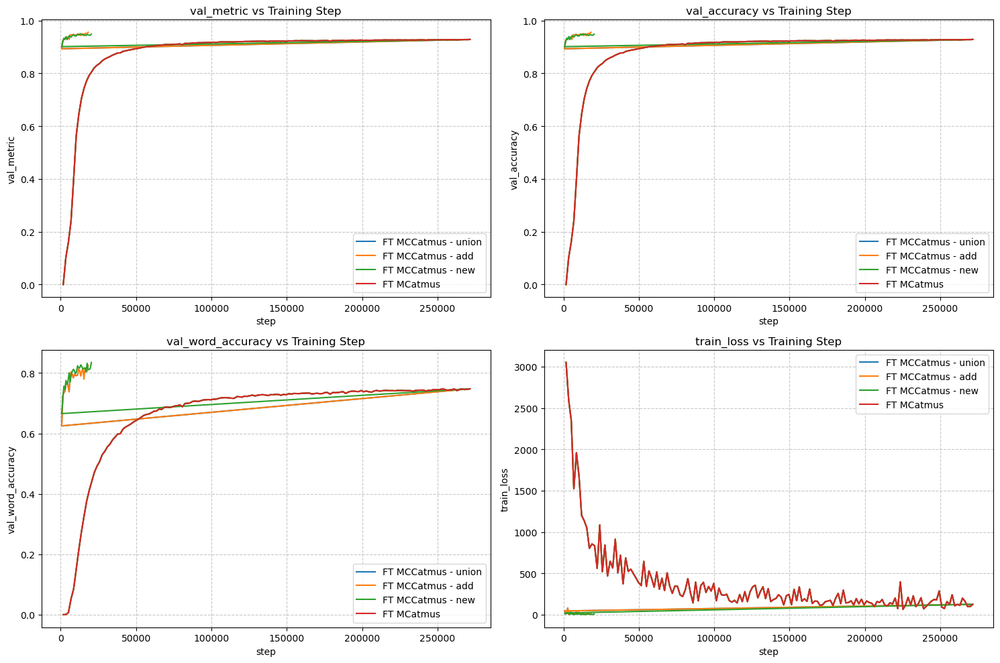

Comparing 4 models on datasets/GIELCZ_Exp_repol.arrow (test split)
--------------------------------------------------

Evaluating model: FT MCCatmus - union
Loading dataset from datasets/GIELCZ_Exp_repol.arrow (split: test)
Loaded 86 samples
Evaluating model on 86 samples...


Evaluating GIELCZ_Exp_repol_mccatmus_union.mlmodel:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluation complete: CER=0.0323, Accuracy=0.9677 (6415 characters)
  - Accuracy: 0.9677
  - CER: 0.0323
  - Word Accuracy: 0.8610

Evaluating model: FT MCCatmus - add
Loading dataset from datasets/GIELCZ_Exp_repol.arrow (split: test)
Loaded 86 samples
Evaluating model on 86 samples...


Evaluating GIELCZ_Exp_repol_mccatmus_add.mlmodel:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluation complete: CER=0.0316, Accuracy=0.9684 (6415 characters)
  - Accuracy: 0.9684
  - CER: 0.0316
  - Word Accuracy: 0.8704

Evaluating model: FT MCCatmus - new
Loading dataset from datasets/GIELCZ_Exp_repol.arrow (split: test)
Loaded 86 samples
Evaluating model on 86 samples...


Evaluating GIELCZ_Exp_repol_mccatmus_new.mlmodel:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluation complete: CER=0.0292, Accuracy=0.9708 (6415 characters)
  - Accuracy: 0.9708
  - CER: 0.0292
  - Word Accuracy: 0.8767

Evaluating model: FT MCatmus
Loading dataset from datasets/GIELCZ_Exp_repol.arrow (split: test)
Loaded 86 samples
Evaluating model on 86 samples...


Evaluating McCATMuS_nfd_nofix_V1.mlmodel:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluation complete: CER=0.2656, Accuracy=0.7344 (6415 characters)
  - Accuracy: 0.7344
  - CER: 0.2656
  - Word Accuracy: 0.2132

Summary:
--------------------------------------------------
FT MCCatmus - new: Accuracy=0.9708, CER=0.0292
FT MCCatmus - add: Accuracy=0.9684, CER=0.0316
FT MCCatmus - union: Accuracy=0.9677, CER=0.0323
FT MCatmus: Accuracy=0.7344, CER=0.2656

Generating visualization...
Comparison complete!


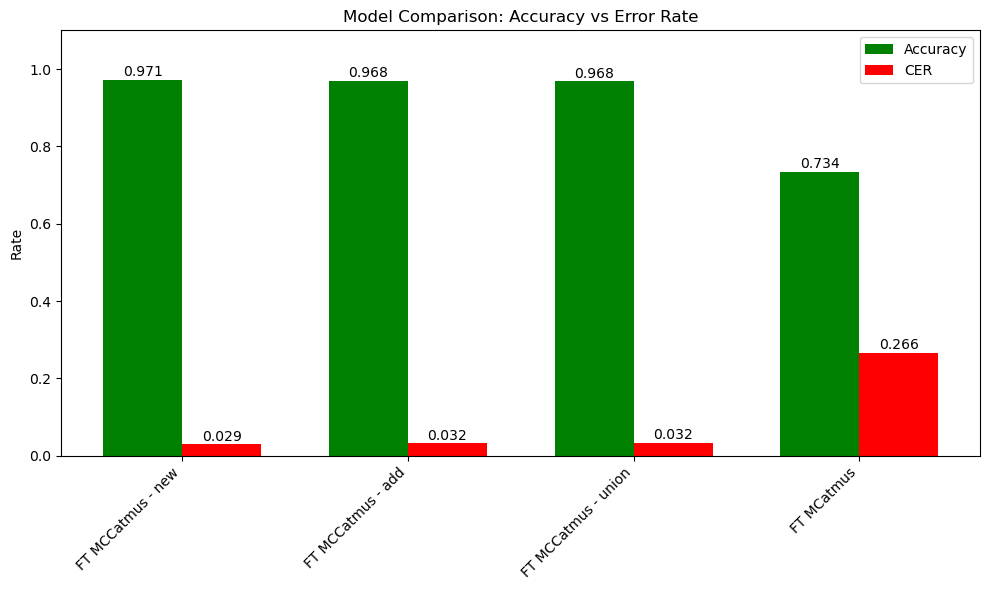

,model,char_error_rate,accuracy,word_accuracy,total_chars
0,FT MCCatmus - union,tensor(0.0323),tensor(0.9677),tensor(0.8610),6415
1,FT MCCatmus - add,tensor(0.0316),tensor(0.9684),tensor(0.8704),6415
2,FT MCCatmus - new,tensor(0.0292),tensor(0.9708),tensor(0.8767),6415
3,FT MCatmus,tensor(0.2656),tensor(0.7344),tensor(0.2132),6415


Analyzing error distributions across 4 models...
  - FT MCCatmus - union: 207 total errors, 82 unique error types
  - FT MCCatmus - add: 203 total errors, 83 unique error types
  - FT MCCatmus - new: 187 total errors, 82 unique error types
  - FT MCatmus: 1704 total errors, 295 unique error types

Top 10 most common errors across all models:
  1.   → ∅: 139 occurrences
  2. i → ∅: 101 occurrences
  3. . → ∅: 85 occurrences
  4. m → ∅: 81 occurrences
  5. u → ∅: 77 occurrences
  ... plus 5 more (see visualization)

Generating error distribution visualization...
Error distribution analysis complete!


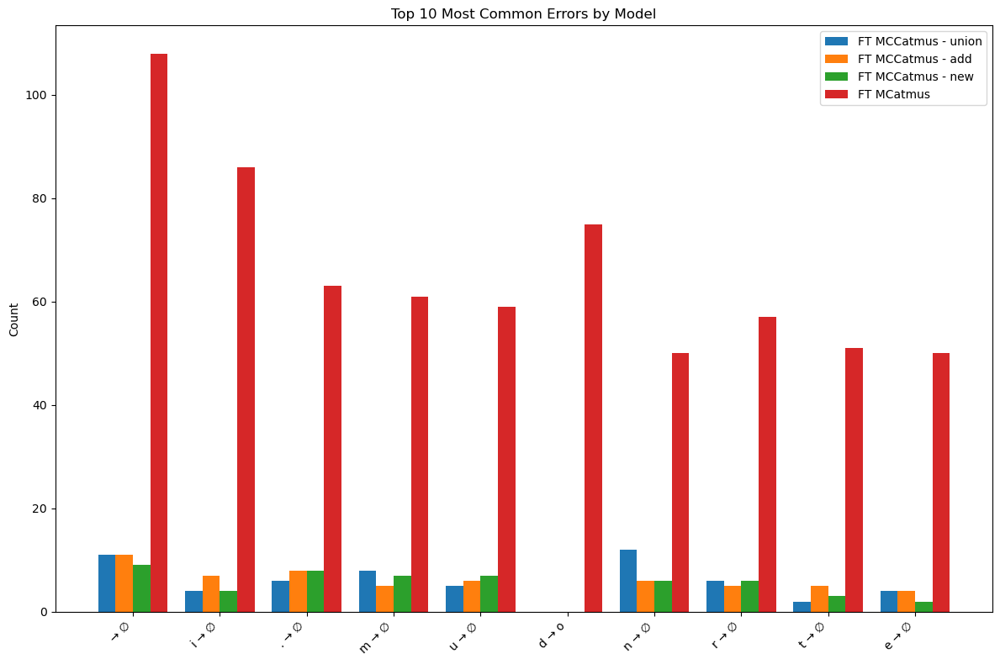



Detailed analysis of first model:

Generating confusion matrix...


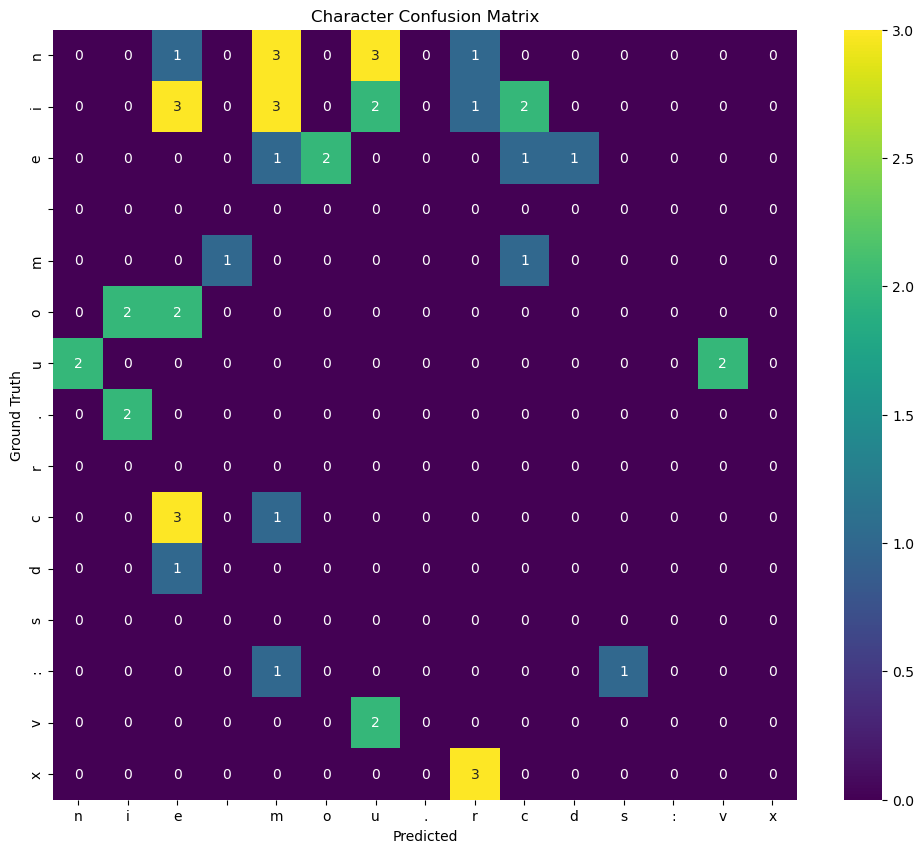


Plotting error distribution...


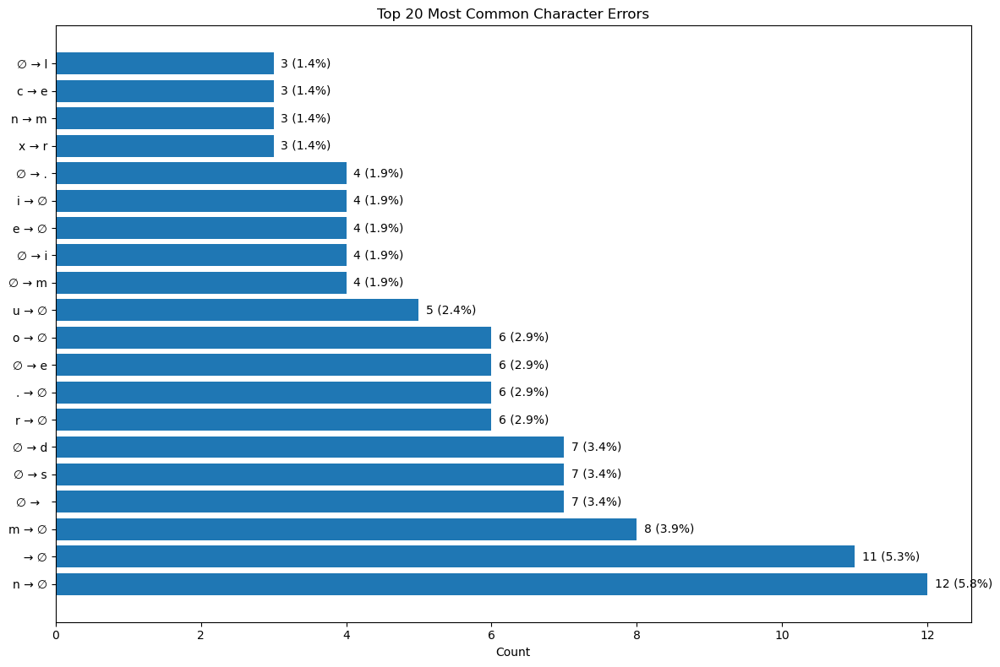


Plotting text length vs. error relationship...


/media/HOME_FOLDERS/krzys/Kod/fontes/htr/output/model_analyzer.py:460: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  length_stats = results_df.groupby('length_bucket').agg(


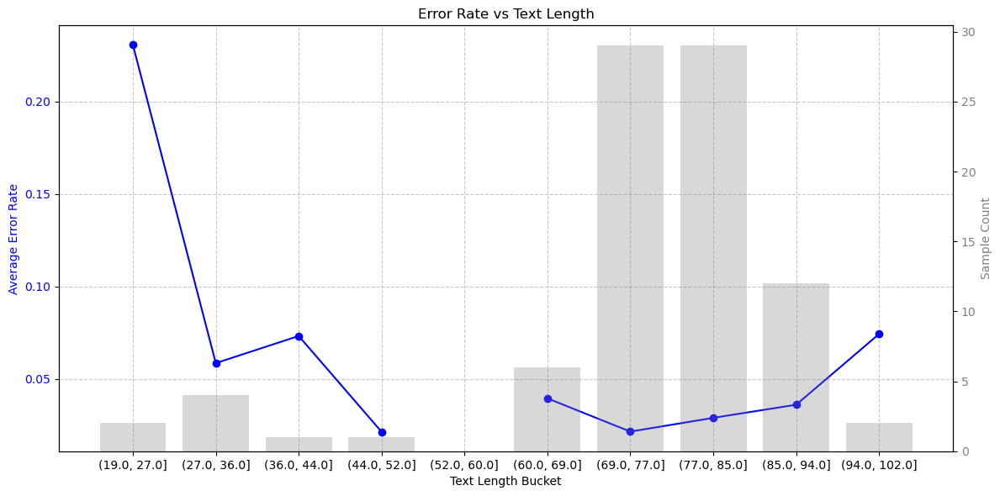

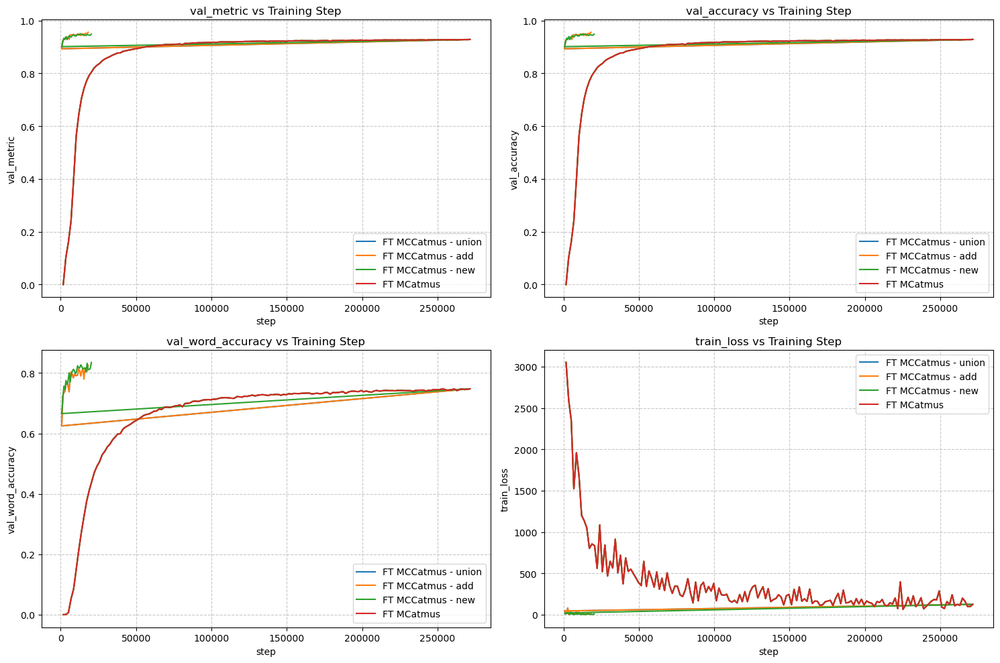

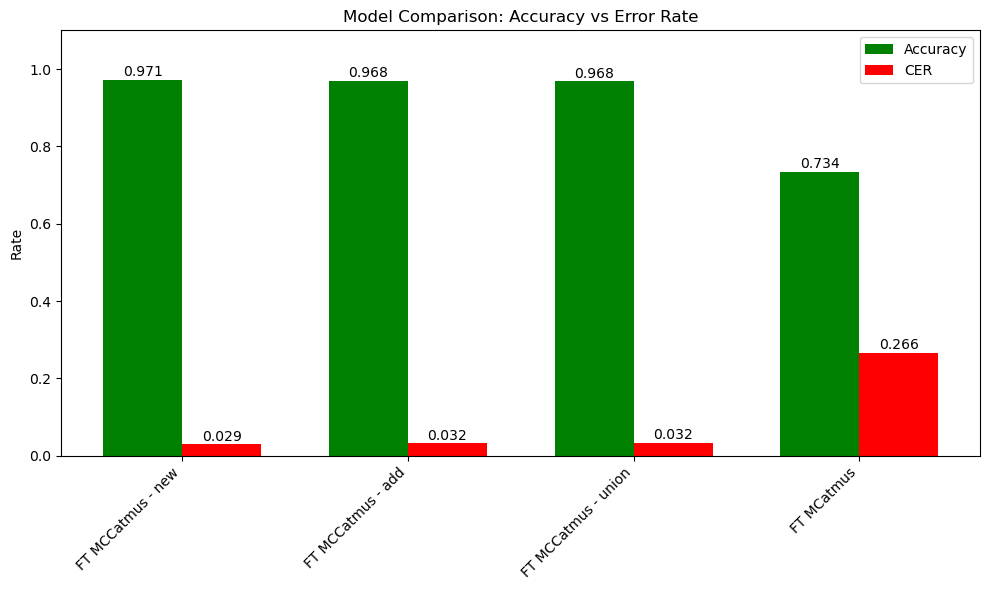

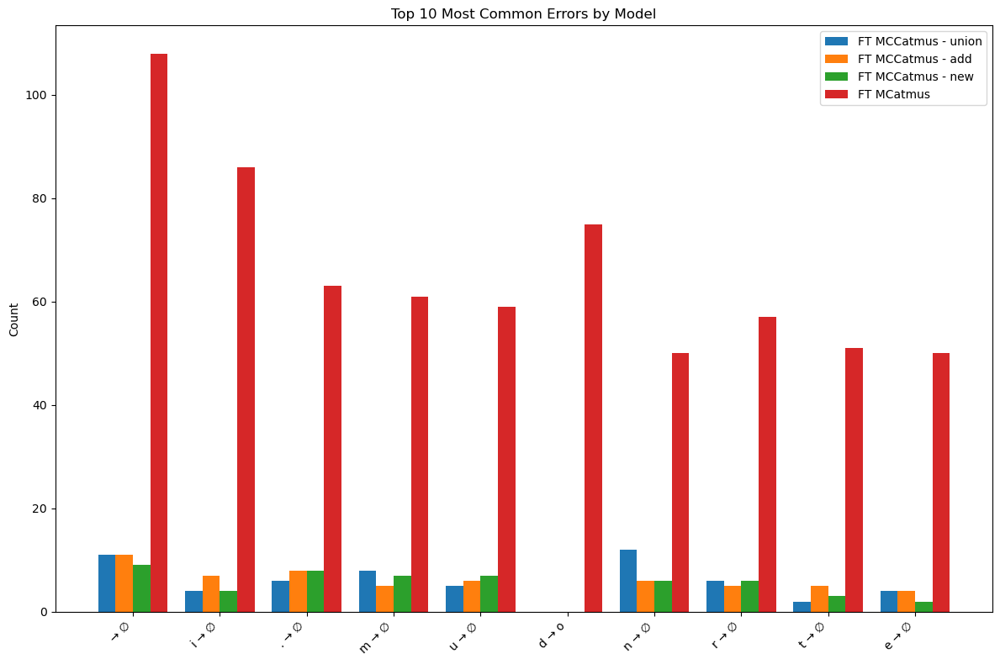

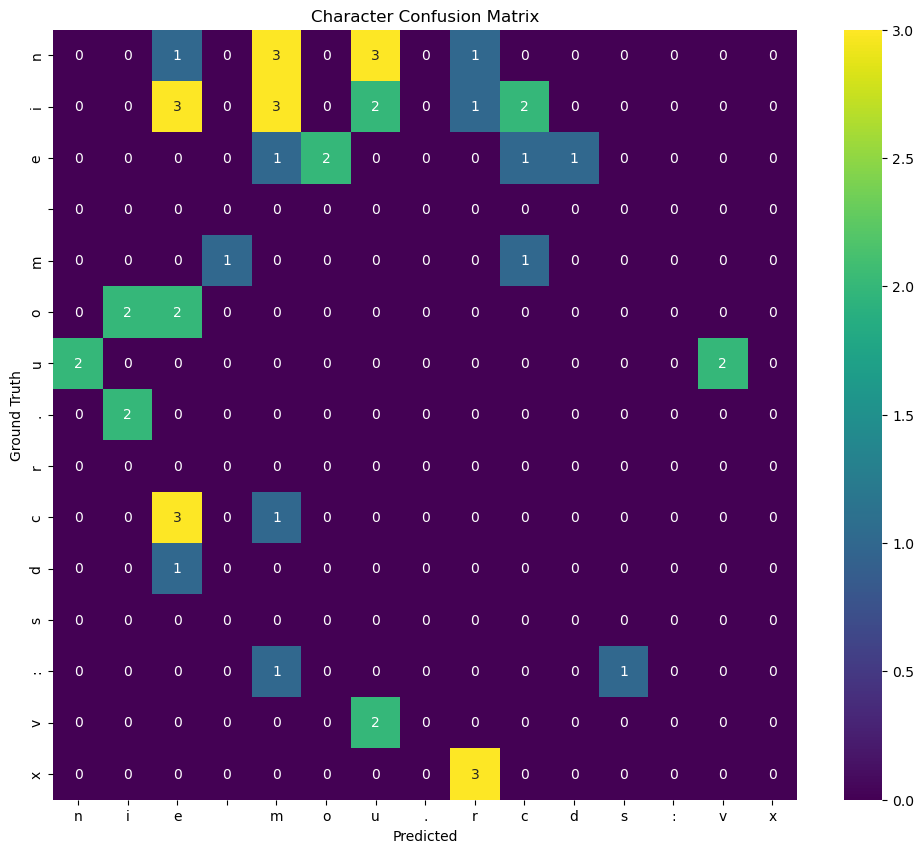

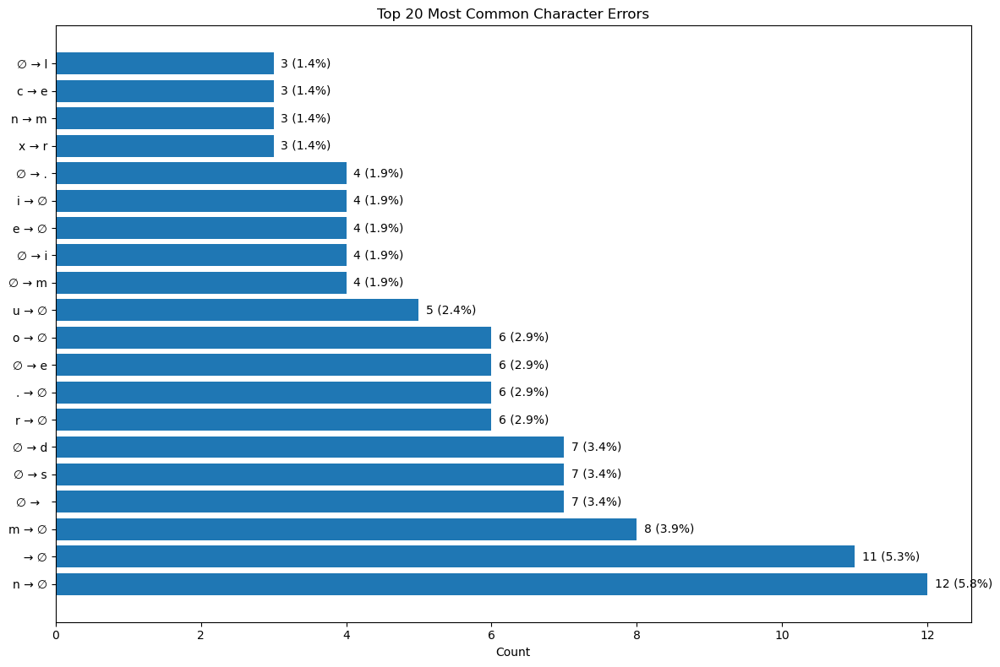

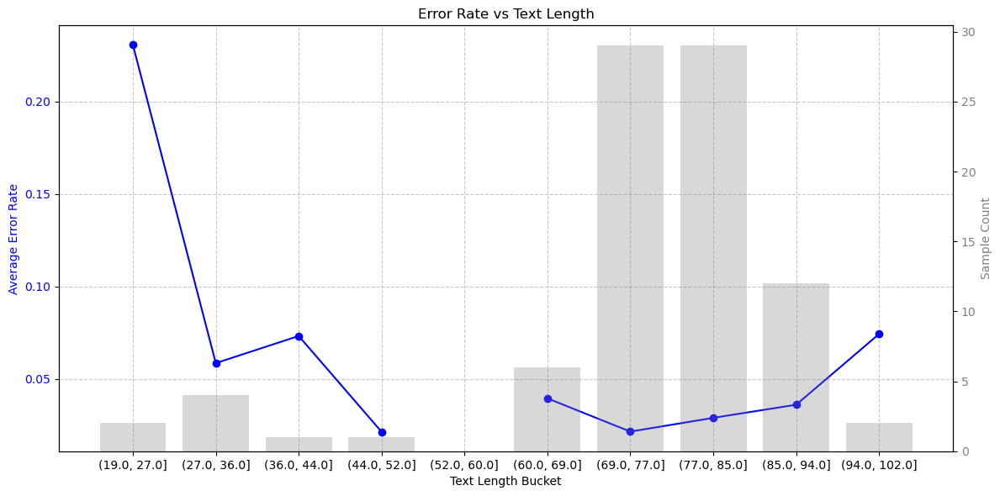

In [10]:
# To compare multiple models
model_paths = [
    #'models/GIELCZ_Exp_raw.mlmodel',
    #'models/GIELCZ_Exp_repol.mlmodel',
    'models/GIELCZ_Exp_repol_mccatmus_union.mlmodel',
    #'GIELCZ_Exp_repol_mccatmus_union_20.mlmodel',
    'models/GIELCZ_Exp_repol_mccatmus_add.mlmodel',
    #'models/GIELCZ_Exp_repol_mccatmus_add.mlmodel',
    'models/GIELCZ_Exp_repol_mccatmus_new.mlmodel',
    '/home/krzys/.config/kraken/McCATMuS_nfd_nofix_V1.mlmodel'
]
model_names = [
    #'Raw', 
    #'Repolygonized', 
              'FT MCCatmus - union',
               'FT MCCatmus - add',
     'FT MCCatmus - new',
    'FT MCatmus'
              # 'FT MCCatmus - add', 'FT MCCatmus - new', 'MCCatmus'
              ]
# Create comparator
comparator = ModelComparator(model_paths, model_names)

# Compare summaries
comparison_df = comparator.compare_summary()
display(comparison_df)  # Nice tabular display in Jupyter

# Compare training metrics
try:
    metrics_fig = comparator.compare_training_metrics()
    display(metrics_fig)
except ValueError as e:
    print(f"Could not compare training metrics: {e}")

# Compare on test split
test_comparison = comparator.compare_evaluation_on_arrow(
    arrow_path='datasets/GIELCZ_Exp_repol.arrow',
    split='test'  # Use 'test' split
)

# Show comparison plot
display(test_comparison['plot'])

# Display accuracy comparison table
display(test_comparison['comparison_df'])

# Compare error distributions
error_comparison = comparator.compare_error_distribution(test_comparison)
display(error_comparison['plot'])

# Individual model analysis
# Let's analyze the first model in more detail
print("\n\nDetailed analysis of first model:")
analyzer = comparator.analyzers[0]

# Show confusion matrix for the first model
print("\nGenerating confusion matrix...")
first_model_results = test_comparison['detailed_results'][model_names[0]]
cm_plot = analyzer.plot_confusion_matrix(first_model_results['confusion_matrix'], top_n=15)
display(cm_plot)

# Show error distribution
print("\nPlotting error distribution...")
err_plot = analyzer.plot_error_distribution(first_model_results, top_n=20)
display(err_plot)

# Visualize text length vs. error rate
print("\nPlotting text length vs. error relationship...")
len_plot = analyzer.plot_lengths_vs_errors(first_model_results['results'])
display(len_plot)


Analyzing character performance for FT MCCatmus - union...

Character recognition performance:


,occurrences,errors,error_rate,accuracy
n,20,20,1.0,0.0
i,15,15,1.0,0.0
e,11,11,1.0,0.0
,11,11,1.0,0.0
m,10,10,1.0,0.0
o,10,10,1.0,0.0
u,9,9,1.0,0.0
.,8,8,1.0,0.0
r,7,7,1.0,0.0
c,7,7,1.0,0.0


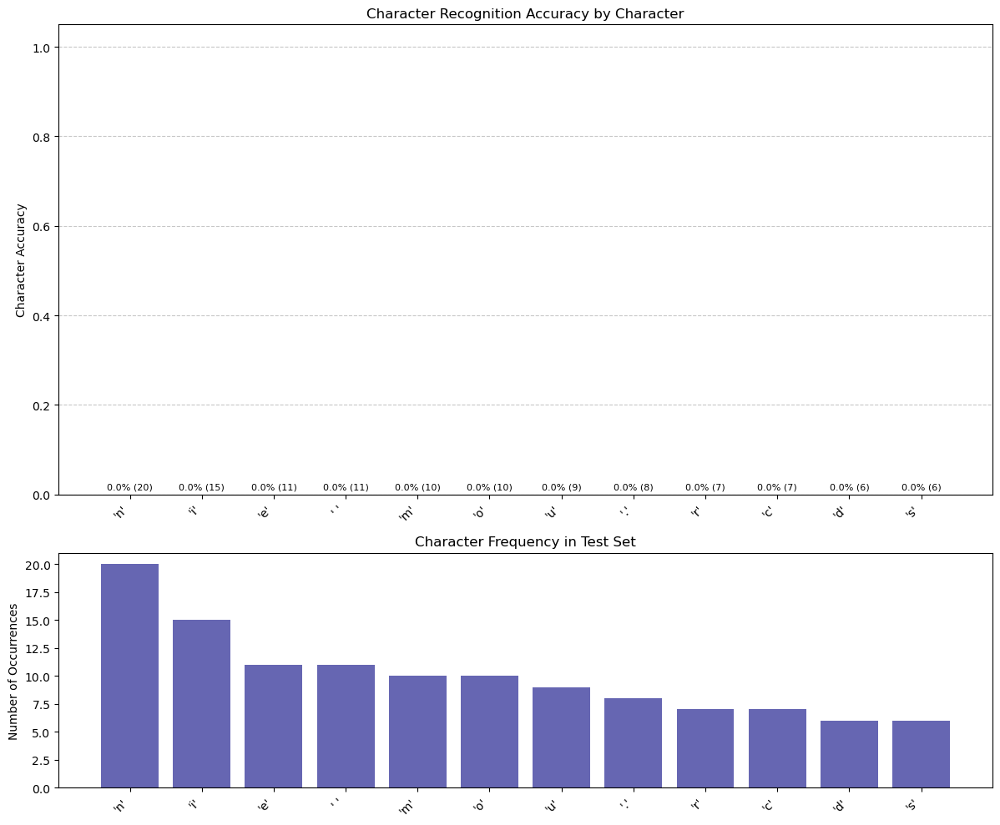


Visualizing sample predictions...


/media/HOME_FOLDERS/krzys/Kod/fontes/htr/output/model_analyzer.py:791: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 27 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


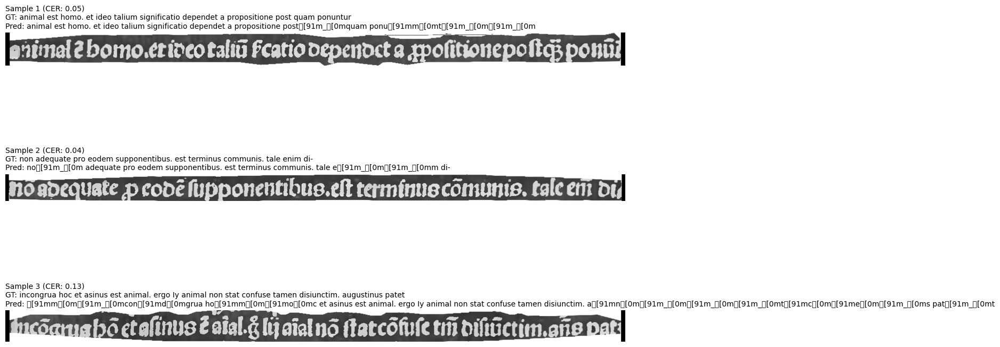

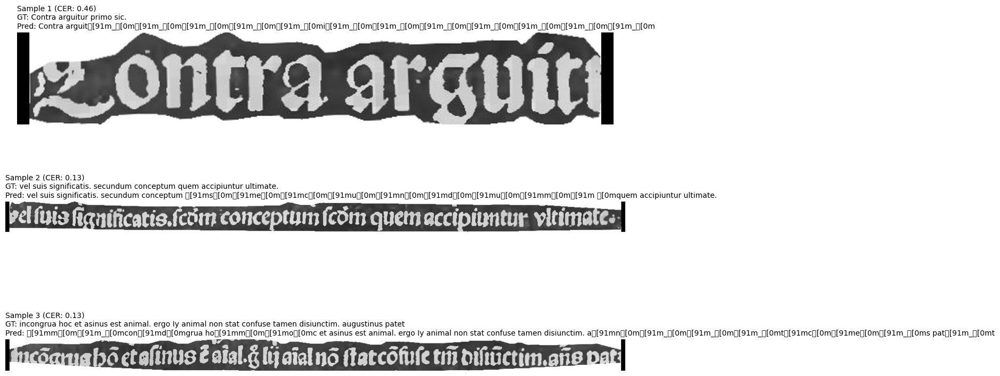

No samples found matching filter criteria. Using random samples.


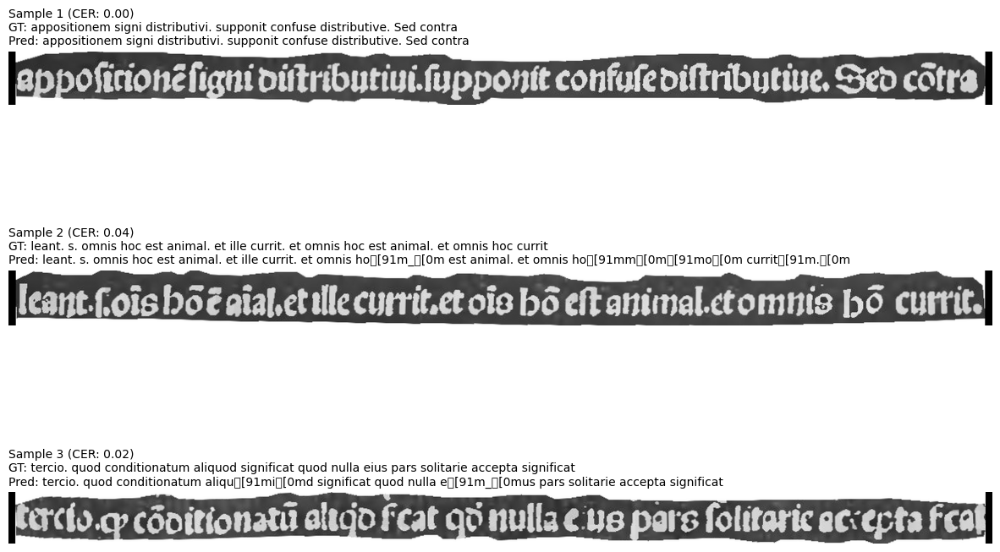

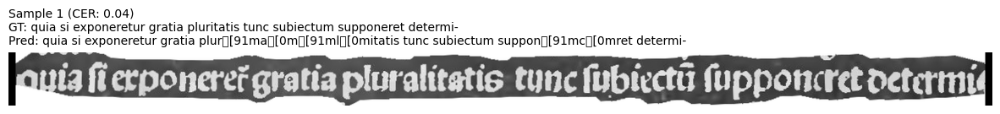


Comparing character performance across models...


NameError: name 'pd' is not defined

/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: Glyph 27 () missing from font(s) DejaVu Sans.
  func(*args, **kwargs)


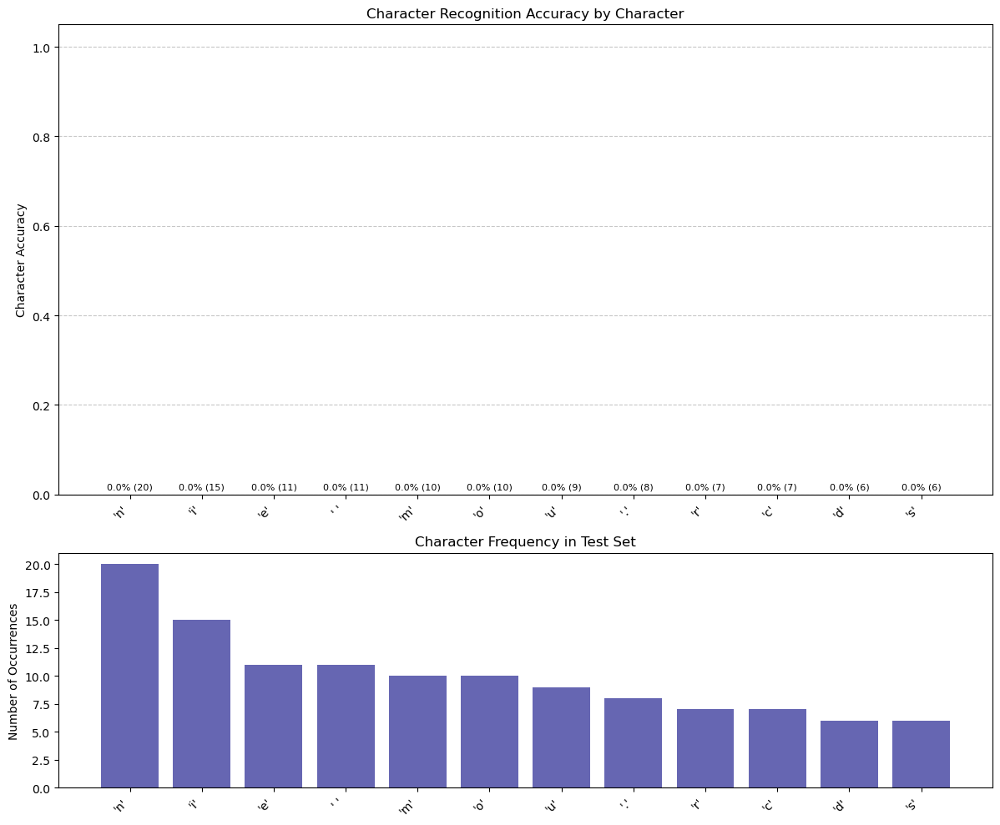

/media/krzys/SYSTEM_APPS/miniforge3/envs/fontes_htr/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 27 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


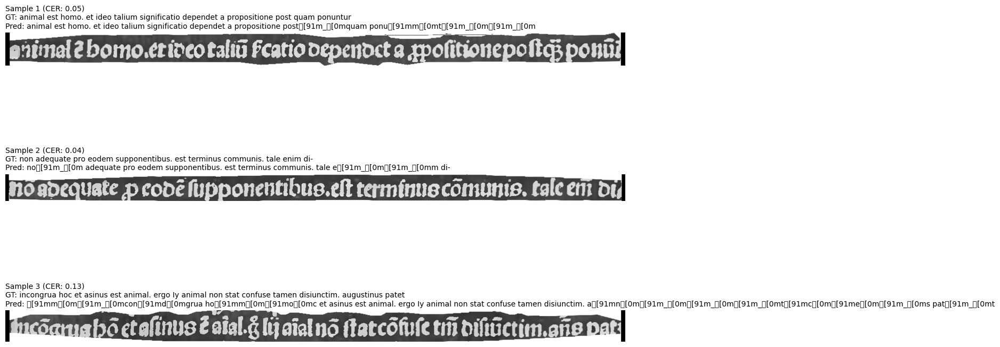

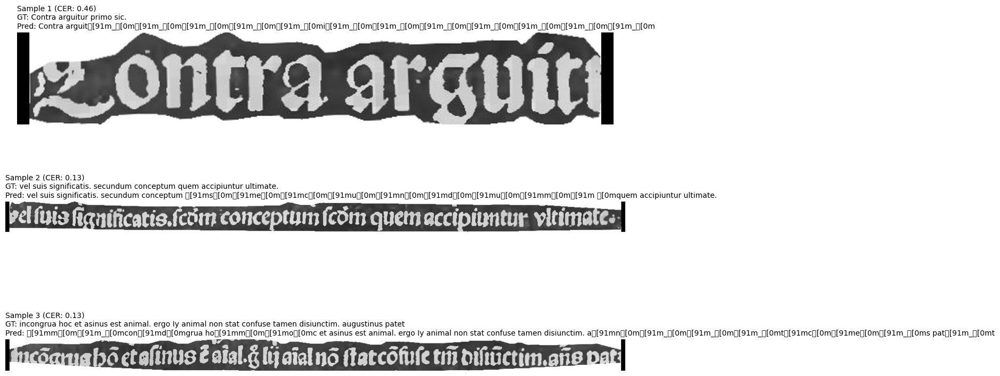

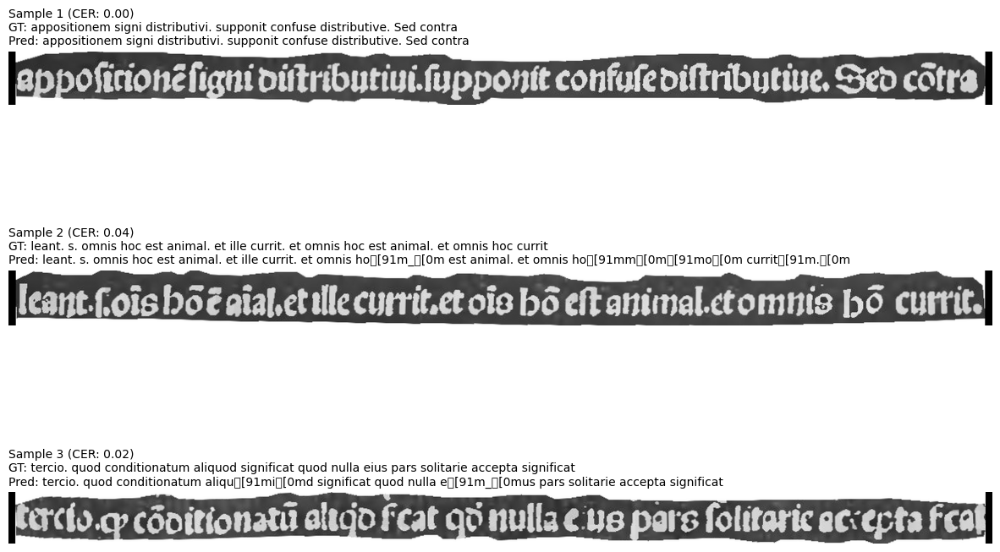

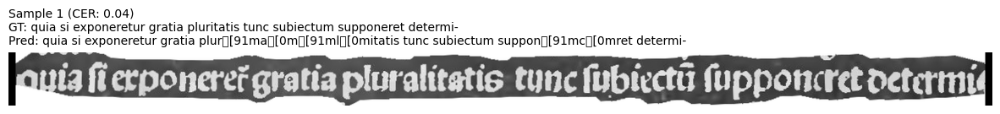

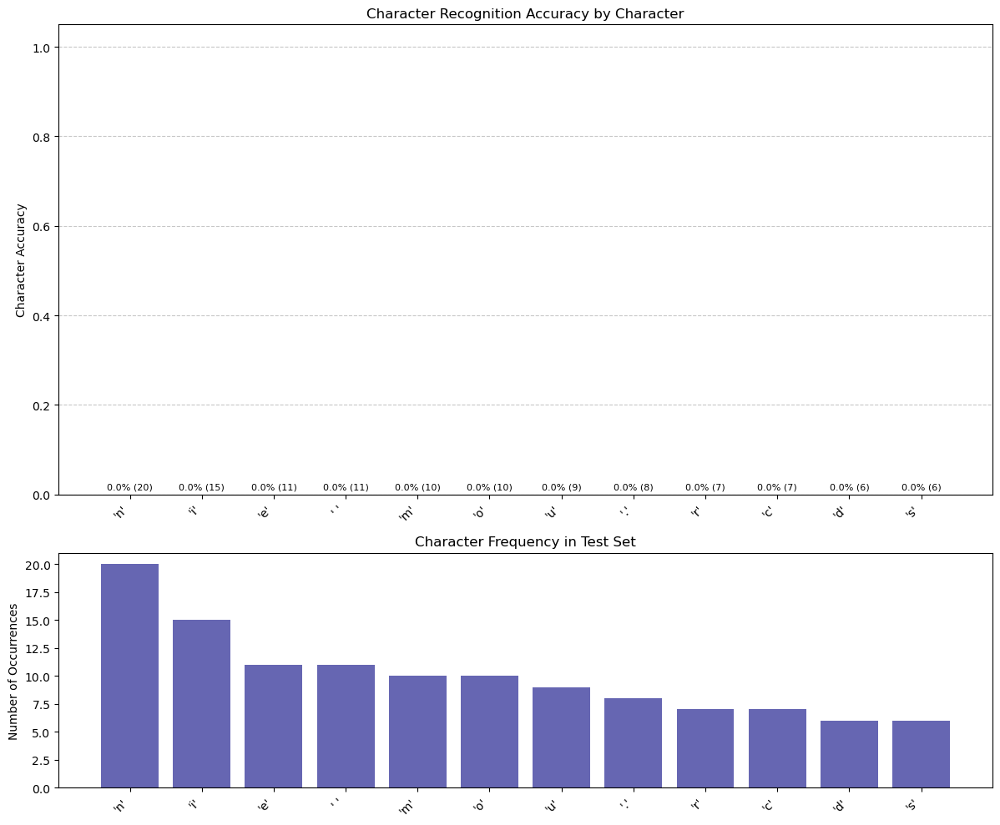

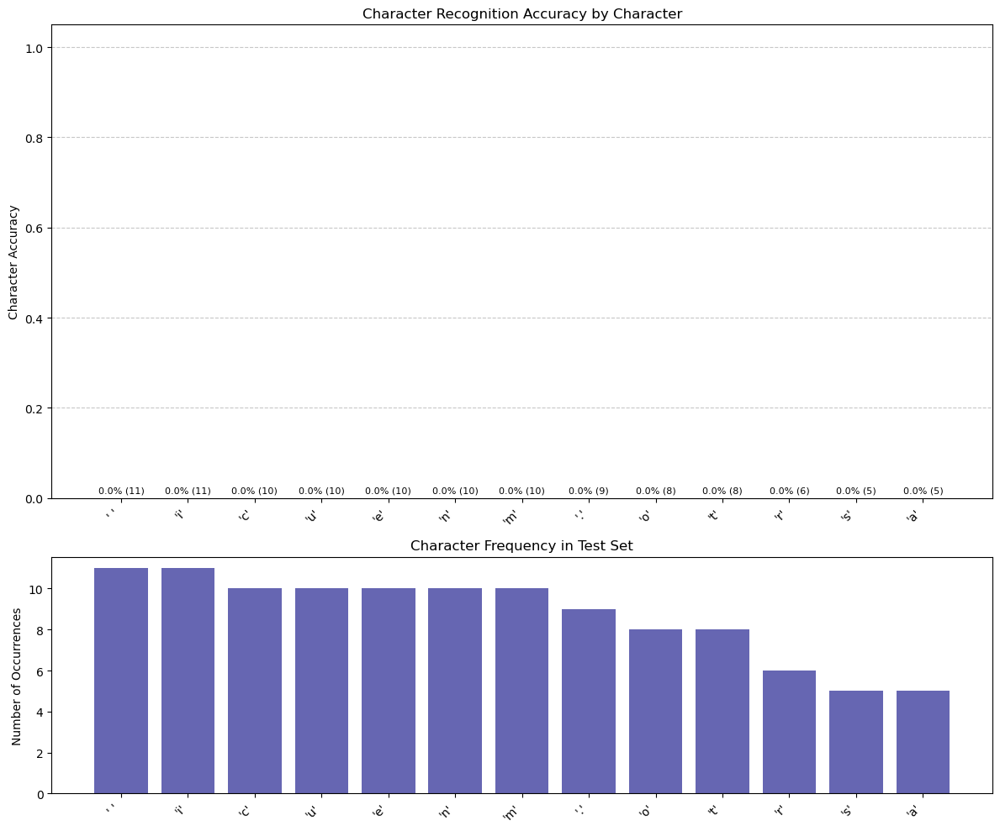

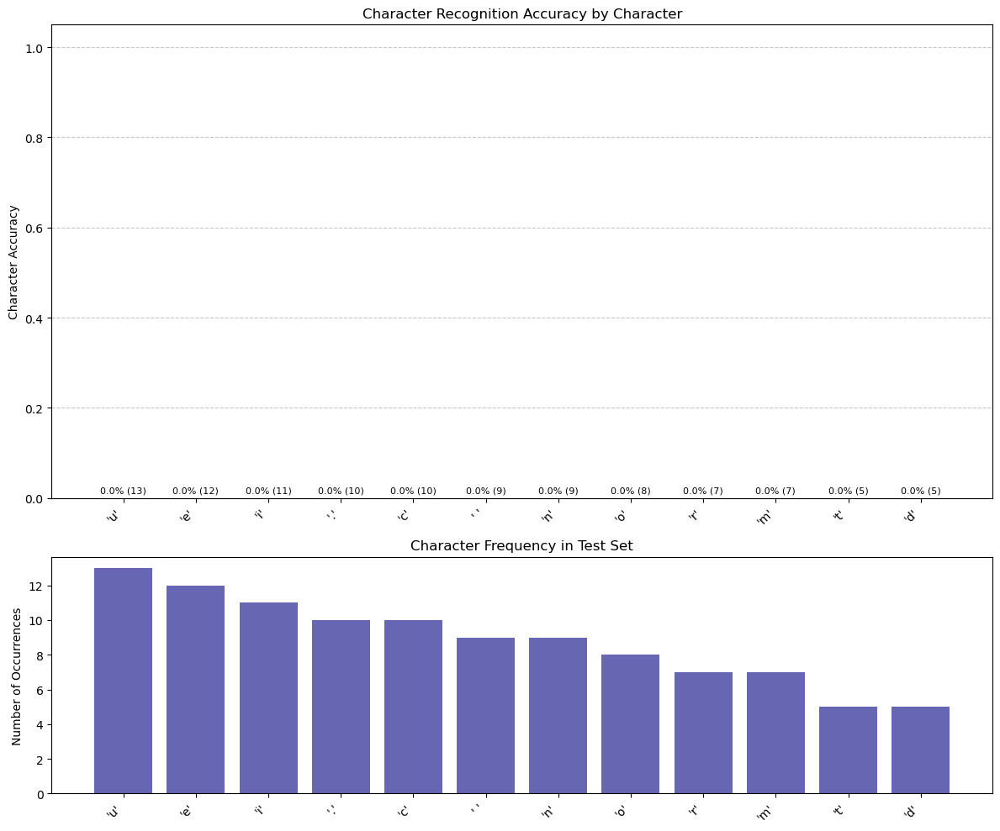

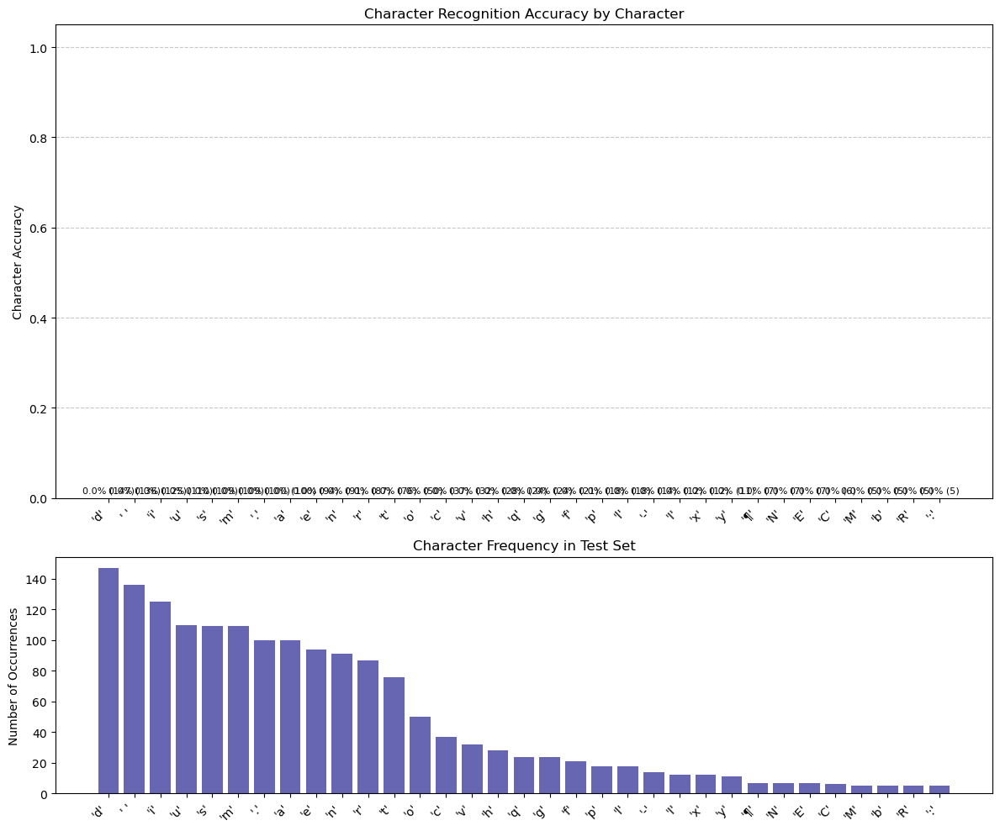

In [11]:
first_model_name = model_names[0]
first_model_results = test_comparison['detailed_results'][first_model_name]

print(f"\nAnalyzing character performance for {first_model_name}...")
char_analysis = comparator.analyzers[0].analyze_character_performance(
    first_model_results,
    top_n=20,  # Show top 20 most frequent characters
    min_occurrences=5  # Only include characters with at least 5 occurrences
)

# Display the character performance data
print("\nCharacter recognition performance:")
display(char_analysis['char_performance_df'])

# Show the visualization
display(char_analysis['plot'])

# 2. Sample Visualization
# Let's look at examples of recognition
print("\nVisualizing sample predictions...")

# 2.1 Random samples
random_samples = comparator.analyzers[0].visualize_samples(
    arrow_path='datasets/GIELCZ_Exp_repol.arrow',
    split='test',
    num_samples=3,
    filter_type='random'
)
display(random_samples['plot'])

# 2.2 Worst performing samples
worst_samples = comparator.analyzers[0].visualize_samples(
    arrow_path='datasets/GIELCZ_Exp_repol.arrow',
    split='test',
    num_samples=3,
    filter_type='worst'
)
display(worst_samples['plot'])

# 2.3 Samples containing a specific character
# For example, samples with the character 'ä'
char_samples = comparator.analyzers[0].visualize_samples(
    arrow_path='datasets/GIELCZ_Exp_repol.arrow',
    split='test',
    num_samples=3,
    filter_type='char',
    filter_value='ä'  # Replace with a character that appears in your dataset
)
display(char_samples['plot'])

# 2.4 Samples with a specific error type
# For example, confusing 'e' with 'c'
error_samples = comparator.analyzers[0].visualize_samples(
    arrow_path='datasets/GIELCZ_Exp_repol.arrow',
    split='test',
    num_samples=3,
    filter_type='error',
    filter_value='e → c'  # Replace with an error that occurs in your models
)
display(error_samples['plot'])

# Comparing character performance across models
print("\nComparing character performance across models...")

# Create a dictionary to store character performance for each model
model_char_performances = {}

for name, analyzer in zip(model_names, comparator.analyzers):
    try:
        results = test_comparison['detailed_results'][name]
        char_analysis = analyzer.analyze_character_performance(
            results, 
            top_n=50,  # Get more characters for comparison
            min_occurrences=5
        )
        model_char_performances[name] = char_analysis['char_performance_df']
    except Exception as e:
        print(f"Could not analyze character performance for {name}: {e}")

# Pick some interesting characters to compare across models
# Combine all DataFrames to find common characters
all_chars = set()
for df in model_char_performances.values():
    all_chars.update(df.index)

# Find characters present in all models
common_chars = set()
for char in all_chars:
    if all(char in df.index for df in model_char_performances.values()):
        common_chars.add(char)

# Select some interesting characters (those with varied performance)
if common_chars:
    # Create comparison DataFrame for the selected characters
    char_comparison = pd.DataFrame()
    
    for char in sorted(common_chars)[:10]:  # Take first 10 common characters
        char_data = {}
        for model_name, df in model_char_performances.items():
            if char in df.index:
                char_data[model_name] = df.loc[char, 'accuracy']
            else:
                char_data[model_name] = None
        
        char_comparison[char] = pd.Series(char_data)
    
    # Display the comparison
    print("\nCharacter recognition accuracy across models:")
    display(char_comparison)
    
    # Create a visualization
    plt.figure(figsize=(12, 8))
    char_comparison.T.plot(kind='bar')
    plt.title('Character Recognition Accuracy Comparison')
    plt.ylabel('Accuracy')
    plt.xlabel('Character')
    plt.legend(title='Model')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    display(plt)
else:
    print("No common characters found across all models.")

### Testing on external data

In [170]:
model_repol_mccatmus_union.nn.save_model

<bound method TorchVGSLModel.save_model of <kraken.lib.vgsl.TorchVGSLModel object at 0x77303c3d21d0>>

In [201]:
model_repol_mccatmus_union.best_model

'GIELCZ_Exp_repol_mccatmus_union_20.mlmodel'

In [ ]:
analyzer = HTRModelAnalyzer('GIELCZ_Exp_repol_mccatmus_union_20.mlmodel')
summary = analyzer.summary()
print(summary)
fig = analyzer.plot_training_metrics()

In [209]:
analyzer.evaluate_on_arrow_dataset(arrow_path='datasets/GIELCZ_Exp_repol.arrow',split="train")

Evaluating on train split:   0%|          | 0/88 [00:00<?, ?it/s]

KeyboardInterrupt: 